# Your First GAN

### Goal
In this notebook, you're going to create your first generative adversarial network (GAN) for this course! Specifically, you will build and train a GAN that can generate hand-written images of digits (0-9). You will be using PyTorch in this specialization, so if you're not familiar with this framework, you may find the [PyTorch documentation](https://pytorch.org/docs/stable/index.html) useful. The hints will also often include links to relevant documentation.

### Learning Objectives
1.   Build the generator and discriminator components of a GAN from scratch.
2.   Create generator and discriminator loss functions.
3.   Train your GAN and visualize the generated images.


## Getting Started
You will begin by importing some useful packages and the dataset you will use to build and train your GAN. You are also provided with a visualizer function to help you investigate the images your GAN will create.


In [1]:
import torch
from torch import nn
from tqdm.auto import tqdm
from torchvision import transforms
from torchvision.datasets import MNIST # Training dataset
from torchvision.utils import make_grid
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
torch.manual_seed(0) # Set for testing purposes, please do not change!

def show_tensor_images(image_tensor, num_images=25, size=(1, 28, 28)):
    '''
    Function for visualizing images: Given a tensor of images, number of images, and
    size per image, plots and prints the images in a uniform grid.
    '''
    image_unflat = image_tensor.detach().cpu().view(-1, *size)
    image_grid = make_grid(image_unflat[:num_images], nrow=5)
    plt.imshow(image_grid.permute(1, 2, 0).squeeze())
    plt.show()

#### MNIST Dataset
The training images your discriminator will be using is from a dataset called [MNIST](http://yann.lecun.com/exdb/mnist/). It contains 60,000 images of handwritten digits, from 0 to 9, like these:

![MNIST Digits](MnistExamples.png)

You may notice that the images are quite pixelated -- this is because they are all only 28 x 28! The small size of its images makes MNIST ideal for simple training. Additionally, these images are also in black-and-white so only one dimension, or "color channel", is needed to represent them (more on this later in the course).

#### Tensor
You will represent the data using [tensors](https://pytorch.org/docs/stable/tensors.html). Tensors are a generalization of matrices: for example, a stack of three matrices with the amounts of red, green, and blue at different locations in a 64 x 64 pixel image is a tensor with the shape 3 x 64 x 64.

Tensors are easy to manipulate and supported by [PyTorch](https://pytorch.org/), the machine learning library you will be using. Feel free to explore them more, but you can imagine these as multi-dimensional matrices or vectors!

#### Batches
While you could train your model after generating one image, it is extremely inefficient and leads to less stable training. In GANs, and in machine learning in general, you will process multiple images per training step. These are called batches.

This means that your generator will generate an entire batch of images and receive the discriminator's feedback on each before updating the model. The same goes for the discriminator, it will calculate its loss on the entire batch of generated images as well as on the reals before the model is updated.

## Generator
The first step is to build the generator component.

You will start by creating a function to make a single layer/block for the generator's neural network. Each block should include a [linear transformation](https://pytorch.org/docs/stable/generated/torch.nn.Linear.html) to map to another shape, a [batch normalization](https://pytorch.org/docs/stable/generated/torch.nn.BatchNorm1d.html) for stabilization, and finally a non-linear activation function (you use a [ReLU here](https://pytorch.org/docs/master/generated/torch.nn.ReLU.html)) so the output can be transformed in complex ways. You will learn more about activations and batch normalization later in the course.

In [6]:
# UNQ_C1 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: get_generator_block
def get_generator_block(input_dim, output_dim):
    '''
    Function for returning a block of the generator's neural network
    given input and output dimensions.
    Parameters:
        input_dim: the dimension of the input vector, a scalar
        output_dim: the dimension of the output vector, a scalar
    Returns:
        a generator neural network layer, with a linear transformation 
          followed by a batch normalization and then a relu activation
    '''
    return nn.Sequential(
        # Hint: Replace all of the "None" with the appropriate dimensions.
        # The documentation may be useful if you're less familiar with PyTorch:
        # https://pytorch.org/docs/stable/nn.html.
        #### START CODE HERE ####
        nn.Linear(input_dim, output_dim),
        nn.BatchNorm1d(output_dim),
        #### END CODE HERE ####
        nn.ReLU(inplace=True)
    )

In [7]:
# Verify the generator block function
def test_gen_block(in_features, out_features, num_test=1000):
    block = get_generator_block(in_features, out_features)

    # Check the three parts
    assert len(block) == 3
    assert type(block[0]) == nn.Linear
    assert type(block[1]) == nn.BatchNorm1d
    assert type(block[2]) == nn.ReLU
    
    # Check the output shape
    test_input = torch.randn(num_test, in_features)
    test_output = block(test_input)
    assert tuple(test_output.shape) == (num_test, out_features)
    assert test_output.std() > 0.55
    assert test_output.std() < 0.65

test_gen_block(25, 12)
test_gen_block(15, 28)
print("Success!")

Success!


Now you can build the generator class. It will take 3 values:

*   The noise vector dimension
*   The image dimension
*   The initial hidden dimension

Using these values, the generator will build a neural network with 5 layers/blocks. Beginning with the noise vector, the generator will apply non-linear transformations via the block function until the tensor is mapped to the size of the image to be outputted (the same size as the real images from MNIST). You will need to fill in the code for final layer since it is different than the others. The final layer does not need a normalization or activation function, but does need to be scaled with a [sigmoid function](https://pytorch.org/docs/master/generated/torch.nn.Sigmoid.html). 

Finally, you are given a forward pass function that takes in a noise vector and generates an image of the output dimension using your neural network.

<details>

<summary>
<font size="3" color="green">
<b>Optional hints for <code><font size="4">Generator</font></code></b>
</font>
</summary>

1. The output size of the final linear transformation should be im_dim, but remember you need to scale the outputs between 0 and 1 using the sigmoid function.
2. [nn.Linear](https://pytorch.org/docs/master/generated/torch.nn.Linear.html) and [nn.Sigmoid](https://pytorch.org/docs/master/generated/torch.nn.Sigmoid.html) will be useful here. 
</details>


In [25]:
# UNQ_C2 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: Generator
class Generator(nn.Module):
    '''
    Generator Class
    Values:
        z_dim: the dimension of the noise vector, a scalar
        im_dim: the dimension of the images, fitted for the dataset used, a scalar
          (MNIST images are 28 x 28 = 784 so that is your default)
        hidden_dim: the inner dimension, a scalar
    '''
    def __init__(self, z_dim=10, im_dim=784, hidden_dim=128):
        super(Generator, self).__init__()
        # Build the neural network
        sigmoid = nn.Sigmoid()
        self.gen = nn.Sequential(
            get_generator_block(z_dim, hidden_dim),
            get_generator_block(hidden_dim, hidden_dim * 2),
            get_generator_block(hidden_dim * 2, hidden_dim * 4),
            get_generator_block(hidden_dim * 4, hidden_dim * 8),
            # There is a dropdown with hints if you need them! 
            #### START CODE HERE ####
            nn.Linear(hidden_dim * 8, im_dim),
            nn.Sigmoid()
            #### END CODE HERE ####
        )
    def forward(self, noise):
        '''
        Function for completing a forward pass of the generator: Given a noise tensor, 
        returns generated images.
        Parameters:
            noise: a noise tensor with dimensions (n_samples, z_dim)
        '''
        return self.gen(noise)
    
    # Needed for grading
    def get_gen(self):
        '''
        Returns:
            the sequential model
        '''
        return self.gen

In [26]:
# Verify the generator class
def test_generator(z_dim, im_dim, hidden_dim, num_test=10000):
    gen = Generator(z_dim, im_dim, hidden_dim).get_gen()
    
    # Check there are six modules in the sequential part
    assert len(gen) == 6
    test_input = torch.randn(num_test, z_dim)
    test_output = gen(test_input)

    # Check that the output shape is correct
    assert tuple(test_output.shape) == (num_test, im_dim)
    assert test_output.max() < 1, "Make sure to use a sigmoid"
    assert test_output.min() > 0, "Make sure to use a sigmoid"
    assert test_output.min() < 0.5, "Don't use a block in your solution"
    assert test_output.std() > 0.05, "Don't use batchnorm here"
    assert test_output.std() < 0.15, "Don't use batchnorm here"

test_generator(5, 10, 20)
test_generator(20, 8, 24)
print("Success!")

Success!


## Noise
To be able to use your generator, you will need to be able to create noise vectors. The noise vector z has the important role of making sure the images generated from the same class don't all look the same -- think of it as a random seed. You will generate it randomly using PyTorch by sampling random numbers from the normal distribution. Since multiple images will be processed per pass, you will generate all the noise vectors at once.

Note that whenever you create a new tensor using torch.ones, torch.zeros, or torch.randn, you either need to create it on the target device, e.g. `torch.ones(3, 3, device=device)`, or move it onto the target device using `torch.ones(3, 3).to(device)`. You do not need to do this if you're creating a tensor by manipulating another tensor or by using a variation that defaults the device to the input, such as `torch.ones_like`. In general, use `torch.ones_like` and `torch.zeros_like` instead of `torch.ones` or `torch.zeros` where possible.

<details>

<summary>
<font size="3" color="green">
<b>Optional hint for <code><font size="4">get_noise</font></code></b>
</font>
</summary>

1. 
You will probably find [torch.randn](https://pytorch.org/docs/master/generated/torch.randn.html) useful here.
</details>

In [29]:
# UNQ_C3 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: get_noise
def get_noise(n_samples, z_dim, device='cpu'):
    '''
    Function for creating noise vectors: Given the dimensions (n_samples, z_dim),
    creates a tensor of that shape filled with random numbers from the normal distribution.
    Parameters:
        n_samples: the number of samples to generate, a scalar
        z_dim: the dimension of the noise vector, a scalar
        device: the device type
    '''
    # NOTE: To use this on GPU with device='cuda', make sure to pass the device 
    # argument to the function you use to generate the noise.
    #### START CODE HERE ####
    return torch.randn(n_samples, z_dim, device=device)
    #### END CODE HERE ####

In [30]:
# Verify the noise vector function
def test_get_noise(n_samples, z_dim, device='cpu'):
    noise = get_noise(n_samples, z_dim, device)
    
    # Make sure a normal distribution was used
    assert tuple(noise.shape) == (n_samples, z_dim)
    assert torch.abs(noise.std() - torch.tensor(1.0)) < 0.01
    assert str(noise.device).startswith(device)

test_get_noise(1000, 100, 'cpu')
if torch.cuda.is_available():
    test_get_noise(1000, 32, 'cuda')
print("Success!")

Success!


In [34]:
get_noise(2, 3)

tensor([[ 0.0567,  2.2544, -0.5717],
        [-1.3207, -0.3678,  0.0033]])

## Discriminator
The second component that you need to construct is the discriminator. As with the generator component, you will start by creating a function that builds a neural network block for the discriminator.

*Note: You use leaky ReLUs to prevent the "dying ReLU" problem, which refers to the phenomenon where the parameters stop changing due to consistently negative values passed to a ReLU, which result in a zero gradient. You will learn more about this in the following lectures!* 


REctified Linear Unit (ReLU) |  Leaky ReLU
:-------------------------:|:-------------------------:
![](https://drive.google.com/uc?export=view&id=1ePf0x1EkkK0Ll0V5lxsZQl5aJ1cEOYOr)  |  ![](https://drive.google.com/uc?export=view&id=1Qp0aiob39MKPGVw6OecYXBhhlx-c-MpB)





In [41]:
# UNQ_C4 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: get_discriminator_block
def get_discriminator_block(input_dim, output_dim):
    '''
    Discriminator Block
    Function for returning a neural network of the discriminator given input and output dimensions.
    Parameters:
        input_dim: the dimension of the input vector, a scalar
        output_dim: the dimension of the output vector, a scalar
    Returns:
        a discriminator neural network layer, with a linear transformation 
          followed by an nn.LeakyReLU activation with negative slope of 0.2 
          (https://pytorch.org/docs/master/generated/torch.nn.LeakyReLU.html)
    '''
    return nn.Sequential(
        #### START CODE HERE ####
        nn.Linear(input_dim, output_dim),
        nn.LeakyReLU(negative_slope=.2)
        #### END CODE HERE ####
    )

In [42]:
# Verify the discriminator block function
def test_disc_block(in_features, out_features, num_test=10000):
    block = get_discriminator_block(in_features, out_features)

    # Check there are two parts
    assert len(block) == 2
    test_input = torch.randn(num_test, in_features)
    test_output = block(test_input)

    # Check that the shape is right
    assert tuple(test_output.shape) == (num_test, out_features)
    
    # Check that the LeakyReLU slope is about 0.2
    assert -test_output.min() / test_output.max() > 0.1
    assert -test_output.min() / test_output.max() < 0.3
    assert test_output.std() > 0.3
    assert test_output.std() < 0.5

test_disc_block(25, 12)
test_disc_block(15, 28)
print("Success!")

Success!


Now you can use these blocks to make a discriminator! The discriminator class holds 2 values:

*   The image dimension
*   The hidden dimension

The discriminator will build a neural network with 4 layers. It will start with the image tensor and transform it until it returns a single number (1-dimension tensor) output. This output classifies whether an image is fake or real. Note that you do not need a sigmoid after the output layer since it is included in the loss function. Finally, to use your discrimator's neural network you are given a forward pass function that takes in an image tensor to be classified.


In [43]:
# UNQ_C5 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: Discriminator
class Discriminator(nn.Module):
    '''
    Discriminator Class
    Values:
        im_dim: the dimension of the images, fitted for the dataset used, a scalar
            (MNIST images are 28x28 = 784 so that is your default)
        hidden_dim: the inner dimension, a scalar
    '''
    def __init__(self, im_dim=784, hidden_dim=128):
        super(Discriminator, self).__init__()
        self.disc = nn.Sequential(
            get_discriminator_block(im_dim, hidden_dim * 4),
            get_discriminator_block(hidden_dim * 4, hidden_dim * 2),
            get_discriminator_block(hidden_dim * 2, hidden_dim),
            # Hint: You want to transform the final output into a single value,
            #       so add one more linear map.
            #### START CODE HERE ####
            nn.Linear(hidden_dim, 1)
            #### END CODE HERE ####
        )

    def forward(self, image):
        '''
        Function for completing a forward pass of the discriminator: Given an image tensor, 
        returns a 1-dimension tensor representing fake/real.
        Parameters:
            image: a flattened image tensor with dimension (im_dim)
        '''
        return self.disc(image)
    
    # Needed for grading
    def get_disc(self):
        '''
        Returns:
            the sequential model
        '''
        return self.disc

In [44]:
# Verify the discriminator class
def test_discriminator(z_dim, hidden_dim, num_test=100):
    
    disc = Discriminator(z_dim, hidden_dim).get_disc()

    # Check there are three parts
    assert len(disc) == 4

    # Check the linear layer is correct
    test_input = torch.randn(num_test, z_dim)
    test_output = disc(test_input)
    assert tuple(test_output.shape) == (num_test, 1)
    
    # Don't use a block
    assert not isinstance(disc[-1], nn.Sequential)

test_discriminator(5, 10)
test_discriminator(20, 8)
print("Success!")

Success!


## Training
Now you can put it all together!
First, you will set your parameters:
  *   criterion: the loss function
  *   n_epochs: the number of times you iterate through the entire dataset when training
  *   z_dim: the dimension of the noise vector
  *   display_step: how often to display/visualize the images
  *   batch_size: the number of images per forward/backward pass
  *   lr: the learning rate
  *   device: the device type, here using a GPU (which runs CUDA), not CPU

Next, you will load the MNIST dataset as tensors using a dataloader.



In [45]:
# Set your parameters
criterion = nn.BCEWithLogitsLoss()
n_epochs = 200
z_dim = 64
display_step = 500
batch_size = 128
lr = 0.00001

# Load MNIST dataset as tensors
dataloader = DataLoader(
    MNIST('.', download=False, transform=transforms.ToTensor()),
    batch_size=batch_size,
    shuffle=True)

### DO NOT EDIT ###
device = 'cuda'

Now, you can initialize your generator, discriminator, and optimizers. Note that each optimizer only takes the parameters of one particular model, since we want each optimizer to optimize only one of the models.

In [46]:
gen = Generator(z_dim).to(device)
gen_opt = torch.optim.Adam(gen.parameters(), lr=lr)
disc = Discriminator().to(device) 
disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)

Before you train your GAN, you will need to create functions to calculate the discriminator's loss and the generator's loss. This is how the discriminator and generator will know how they are doing and improve themselves. Since the generator is needed when calculating the discriminator's loss, you will need to call .detach() on the generator result to ensure that only the discriminator is updated!

Remember that you have already defined a loss function earlier (`criterion`) and you are encouraged to use `torch.ones_like` and `torch.zeros_like` instead of `torch.ones` or `torch.zeros`. If you use `torch.ones` or `torch.zeros`, you'll need to pass `device=device` to them.

In [93]:
# UNQ_C6 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: get_disc_loss
def get_disc_loss(gen, disc, criterion, real, num_images, z_dim, device):
    '''
    Return the loss of the discriminator given inputs.
    Parameters:
        gen: the generator model, which returns an image given z-dimensional noise
        disc: the discriminator model, which returns a single-dimensional prediction of real/fake
        criterion: the loss function, which should be used to compare 
               the discriminator's predictions to the ground truth reality of the images 
               (e.g. fake = 0, real = 1)
        real: a batch of real images
        num_images: the number of images the generator should produce, 
                which is also the length of the real images
        z_dim: the dimension of the noise vector, a scalar
        device: the device type
    Returns:
        disc_loss: a torch scalar loss value for the current batch
    '''
    #     These are the steps you will need to complete:
    #       1) Create noise vectors and generate a batch (num_images) of fake images. 
    #            Make sure to pass the device argument to the noise.
    #       2) Get the discriminator's prediction of the fake image 
    #            and calculate the loss. Don't forget to detach the generator!
    #            (Remember the loss function you set earlier -- criterion. You need a 
    #            'ground truth' tensor in order to calculate the loss. 
    #            For example, a ground truth tensor for a fake image is all zeros.)
    #       3) Get the discriminator's prediction of the real image and calculate the loss.
    #       4) Calculate the discriminator's loss by averaging the real and fake loss
    #            and set it to disc_loss.
    #     *Important*: You should NOT write your own loss function here - use criterion(pred, true)!
    #### START CODE HERE ####
    # 1.
    noise_samples = get_noise(n_samples= num_images, z_dim=z_dim, device=device)
    fake_images = gen(noise_samples)
    # 2. 
    disc_noise_preds = disc(fake_images.detach())
#     print("------------NOISE------------")
#     print(disc_noise_preds,torch.zeros_like(input=disc_noise_preds, device=device))
    
    disc_noise_loss = criterion(disc_noise_preds, torch.zeros_like(input=disc_noise_preds, device=device))
    # 3. 
    disc_real_preds = disc(real)
#     print("------------PREDS------------")
#     print(disc_real_preds, torch.ones_like(input=disc_real_preds.detach(), device=device))
    disc_real_loss = criterion(disc_real_preds, torch.ones_like(input=disc_real_preds, device=device))
    #4.
#     print("------------CALCS------------")
#     print(disc_noise_loss)
#     print(disc_real_loss)
    disc_loss = (disc_noise_loss +  disc_real_loss) / 2
    
    #### END CODE HERE ####
    return disc_loss

In [94]:
def test_disc_reasonable(num_images=10):
    # Don't use explicit casts to cuda - use the device argument
    import inspect, re
    lines = inspect.getsource(get_disc_loss)
    assert (re.search(r"to\(.cuda.\)", lines)) is None
    assert (re.search(r"\.cuda\(\)", lines)) is None
    
    z_dim = 64
    gen = torch.zeros_like
    disc = lambda x: x.mean(1)[:, None]
    criterion = torch.mul # Multiply
    real = torch.ones(num_images, z_dim)
    disc_loss = get_disc_loss(gen, disc, criterion, real, num_images, z_dim, 'cpu')
    assert torch.all(torch.abs(disc_loss.mean() - 0.5) < 1e-5)
    
    gen = torch.ones_like
    criterion = torch.mul # Multiply
    real = torch.zeros(num_images, z_dim)
    assert torch.all(torch.abs(get_disc_loss(gen, disc, criterion, real, num_images, z_dim, 'cpu')) < 1e-5)
    
    gen = lambda x: torch.ones(num_images, 10)
    disc = lambda x: x.mean(1)[:, None] + 10
    criterion = torch.mul # Multiply
    real = torch.zeros(num_images, 10)
    assert torch.all(torch.abs(get_disc_loss(gen, disc, criterion, real, num_images, z_dim, 'cpu').mean() - 5) < 1e-5)

    gen = torch.ones_like
    disc = nn.Linear(64, 1, bias=False)
    real = torch.ones(num_images, 64) * 0.5
    disc.weight.data = torch.ones_like(disc.weight.data) * 0.5
    disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)
    criterion = lambda x, y: torch.sum(x) + torch.sum(y)
    disc_loss = get_disc_loss(gen, disc, criterion, real, num_images, z_dim, 'cpu').mean()
    disc_loss.backward()
    assert torch.isclose(torch.abs(disc.weight.grad.mean() - 11.25), torch.tensor(3.75))
    
def test_disc_loss(max_tests = 10):
    z_dim = 64
    gen = Generator(z_dim).to(device)
    gen_opt = torch.optim.Adam(gen.parameters(), lr=lr)
    disc = Discriminator().to(device) 
    disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)
    num_steps = 0
    for real, _ in dataloader:
        cur_batch_size = len(real)
        real = real.view(cur_batch_size, -1).to(device)

        ### Update discriminator ###
        # Zero out the gradient before backpropagation
        disc_opt.zero_grad()

        # Calculate discriminator loss
        disc_loss = get_disc_loss(gen, disc, criterion, real, cur_batch_size, z_dim, device)
        assert (disc_loss - 0.68).abs() < 0.05

        # Update gradients
        disc_loss.backward(retain_graph=True)

        # Check that they detached correctly
        assert gen.gen[0][0].weight.grad is None

        # Update optimizer
        old_weight = disc.disc[0][0].weight.data.clone()
        disc_opt.step()
        new_weight = disc.disc[0][0].weight.data
        
        # Check that some discriminator weights changed
        assert not torch.all(torch.eq(old_weight, new_weight))
        num_steps += 1
        if num_steps >= max_tests:
            break

test_disc_reasonable()
test_disc_loss()
print("Success!")


Success!


In [106]:
# UNQ_C7 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: get_gen_loss
def get_gen_loss(gen, disc, criterion, num_images, z_dim, device):
    '''
    Return the loss of the generator given inputs.
    Parameters:
        gen: the generator model, which returns an image given z-dimensional noise
        disc: the discriminator model, which returns a single-dimensional prediction of real/fake
        criterion: the loss function, which should be used to compare 
               the discriminator's predictions to the ground truth reality of the images 
               (e.g. fake = 0, real = 1)
        num_images: the number of images the generator should produce, 
                which is also the length of the real images
        z_dim: the dimension of the noise vector, a scalar
        device: the device type
    Returns:
        gen_loss: a torch scalar loss value for the current batch
    '''
    #     These are the steps you will need to complete:
    #       1) Create noise vectors and generate a batch of fake images. 
    #           Remember to pass the device argument to the get_noise function.
    #       2) Get the discriminator's prediction of the fake image.
    #       3) Calculate the generator's loss. Remember the generator wants
    #          the discriminator to think that its fake images are real
    #     *Important*: You should NOT write your own loss function here - use criterion(pred, true)!

    #### START CODE HERE ####
    # 1.
    noise_samples = get_noise(n_samples= num_images, z_dim=z_dim, device=device)
    fake_images = gen(noise_samples)
    # 2.
    disc_noise_preds = disc(fake_images)
    # 3.
    gen_loss = criterion(disc_noise_preds, torch.ones_like(input=disc_noise_preds))
    #### END CODE HERE ####
    return gen_loss

In [108]:
def test_gen_reasonable(num_images=10):
    # Don't use explicit casts to cuda - use the device argument
    import inspect, re
    lines = inspect.getsource(get_gen_loss)
    assert (re.search(r"to\(.cuda.\)", lines)) is None
    assert (re.search(r"\.cuda\(\)", lines)) is None
    
    z_dim = 64
    gen = torch.zeros_like
    disc = nn.Identity()
    criterion = torch.mul # Multiply
    gen_loss_tensor = get_gen_loss(gen, disc, criterion, num_images, z_dim, 'cpu')
    assert torch.all(torch.abs(gen_loss_tensor) < 1e-5)
    #Verify shape. Related to gen_noise parametrization
    assert tuple(gen_loss_tensor.shape) == (num_images, z_dim)

    gen = torch.ones_like
    disc = nn.Identity()
    criterion = torch.mul # Multiply
    gen_loss_tensor = get_gen_loss(gen, disc, criterion, num_images, z_dim, 'cpu')
    assert torch.all(torch.abs(gen_loss_tensor - 1) < 1e-5)
    #Verify shape. Related to gen_noise parametrization
    assert tuple(gen_loss_tensor.shape) == (num_images, z_dim)
    

def test_gen_loss(num_images):
    z_dim = 64
    gen = Generator(z_dim).to(device)
    gen_opt = torch.optim.Adam(gen.parameters(), lr=lr)
    disc = Discriminator().to(device) 
    disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)
    
    gen_loss = get_gen_loss(gen, disc, criterion, num_images, z_dim, device)
    
    # Check that the loss is reasonable
    assert (gen_loss - 0.7).abs() < 0.1
    gen_loss.backward()
    old_weight = gen.gen[0][0].weight.clone()
    gen_opt.step()
    new_weight = gen.gen[0][0].weight
    assert not torch.all(torch.eq(old_weight, new_weight))


test_gen_reasonable(10)
test_gen_loss(18)
print("Success!")

Success!


Finally, you can put everything together! For each epoch, you will process the entire dataset in batches. For every batch, you will need to update the discriminator and generator using their loss. Batches are sets of images that will be predicted on before the loss functions are calculated (instead of calculating the loss function after each image). Note that you may see a loss to be greater than 1, this is okay since binary cross entropy loss can be any positive number for a sufficiently confident wrong guess. 

It’s also often the case that the discriminator will outperform the generator, especially at the start, because its job is easier. It's important that neither one gets too good (that is, near-perfect accuracy), which would cause the entire model to stop learning. Balancing the two models is actually remarkably hard to do in a standard GAN and something you will see more of in later lectures and assignments.

After you've submitted a working version with the original architecture, feel free to play around with the architecture if you want to see how different architectural choices can lead to better or worse GANs. For example, consider changing the size of the hidden dimension, or making the networks shallower or deeper by changing the number of layers.

<!-- In addition, be warned that this runs very slowly on a CPU. One way to run this more quickly is to use Google Colab: 

1.   Download the .ipynb
2.   Upload it to Google Drive and open it with Google Colab
3.   Make the runtime type GPU (under “Runtime” -> “Change runtime type” -> Select “GPU” from the dropdown)
4.   Replace `device = "cpu"` with `device = "cuda"`
5.   Make sure your `get_noise` function uses the right device -->

But remember, don’t expect anything spectacular: this is only the first lesson. The results will get better with later lessons as you learn methods to help keep your generator and discriminator at similar levels.

You should roughly expect to see this progression. On a GPU, this should take about 15 seconds per 500 steps, on average, while on CPU it will take roughly 1.5 minutes:
![MNIST Digits](https://drive.google.com/uc?export=view&id=1BlfFNZACaieFrOjMv_o2kGqwAR6eiLmN)

Step 500: Generator loss: 1.4483303184509284, discriminator loss: 0.40636159706115715


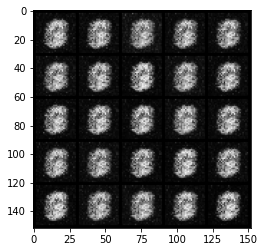

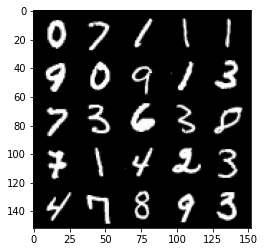

Step 1000: Generator loss: 1.7844473016262055, discriminator loss: 0.2698691385388373


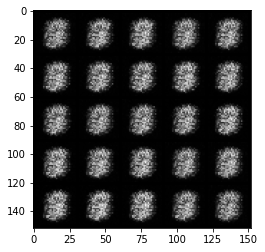

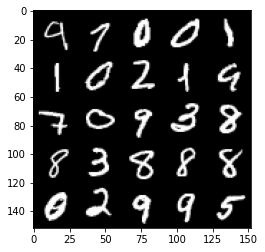

Step 1500: Generator loss: 2.092928281545636, discriminator loss: 0.15486630785465255


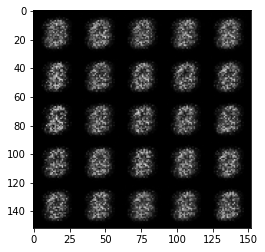

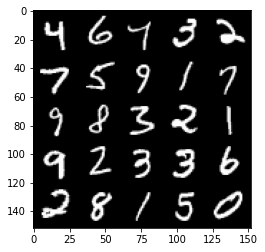

Step 2000: Generator loss: 1.8140569350719435, discriminator loss: 0.195050647556782


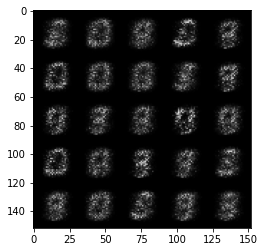

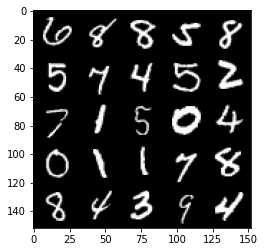

Step 2500: Generator loss: 1.6513762300014496, discriminator loss: 0.222499862730503


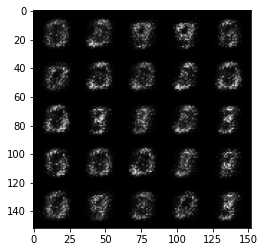

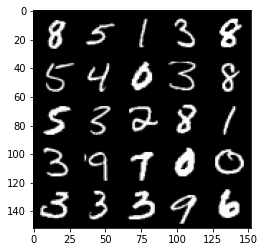

Step 3000: Generator loss: 1.8711538913249965, discriminator loss: 0.18555343550443662


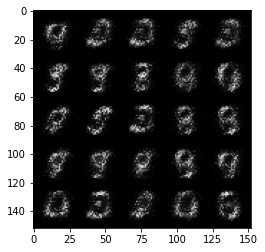

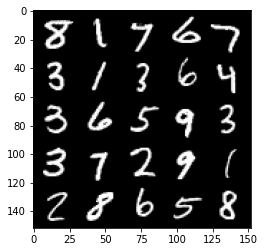

Step 3500: Generator loss: 2.165903285264969, discriminator loss: 0.1697581768631935


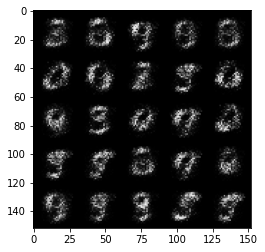

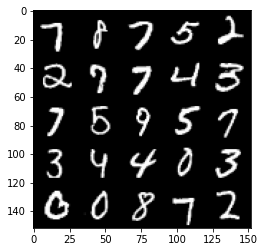

Step 4000: Generator loss: 2.535220660209656, discriminator loss: 0.14362302672862995


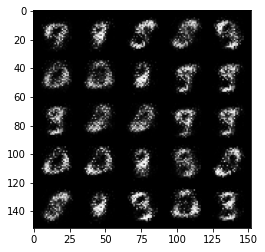

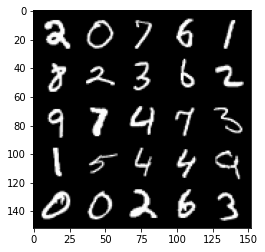

Step 4500: Generator loss: 2.9945529494285617, discriminator loss: 0.0978230993896722


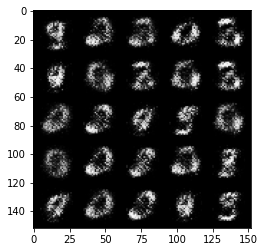

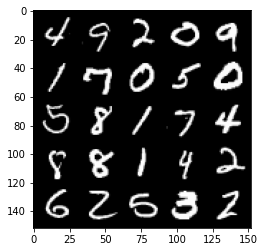

Step 5000: Generator loss: 3.4476296920776366, discriminator loss: 0.08078787110000847


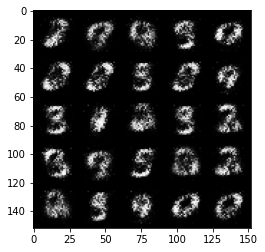

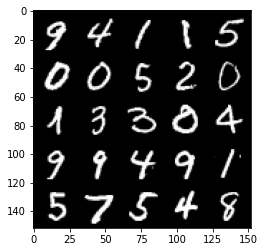

Step 5500: Generator loss: 3.5524571070671076, discriminator loss: 0.0788768868893385


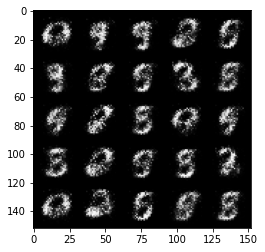

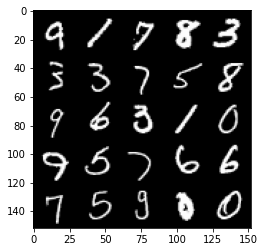

Step 6000: Generator loss: 3.8680650486946084, discriminator loss: 0.062166522048413775


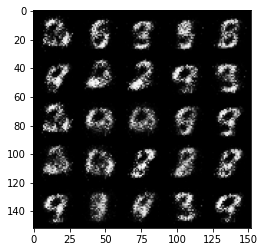

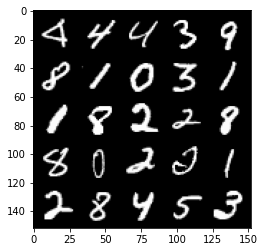

Step 6500: Generator loss: 3.9968071780204744, discriminator loss: 0.056706615626811945


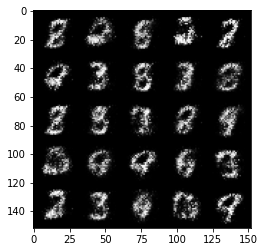

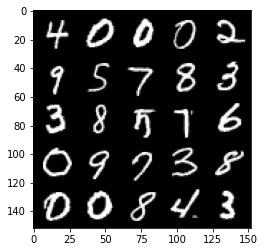

Step 7000: Generator loss: 4.099594792842865, discriminator loss: 0.055940412338823055


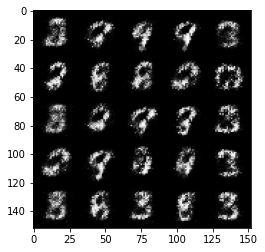

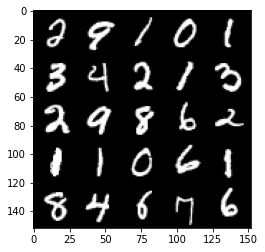

Step 7500: Generator loss: 4.06434372472763, discriminator loss: 0.0660301750302315


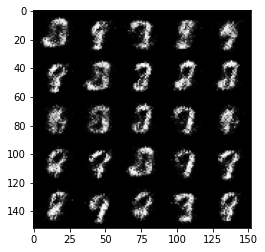

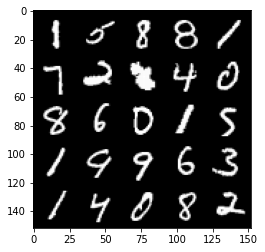

Step 8000: Generator loss: 4.041203382968902, discriminator loss: 0.06077218111604453


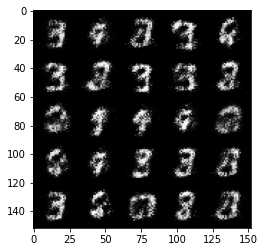

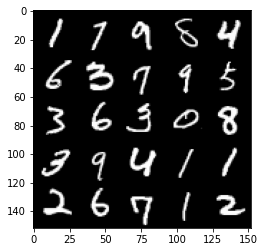

Step 8500: Generator loss: 4.211410011768342, discriminator loss: 0.058949196033179795


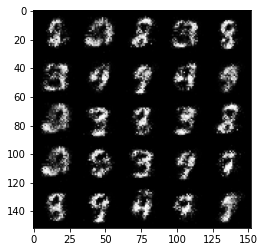

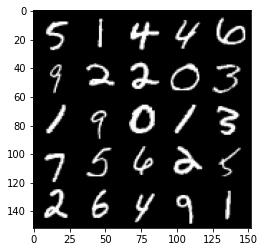

Step 9000: Generator loss: 4.306002010822293, discriminator loss: 0.05749860451370481


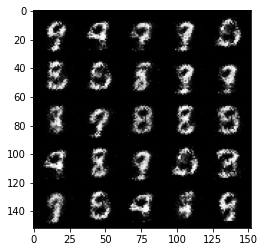

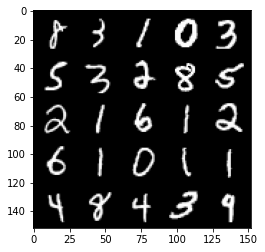

Step 9500: Generator loss: 4.333532217025758, discriminator loss: 0.07041296786069873


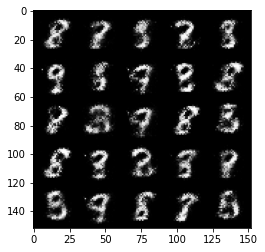

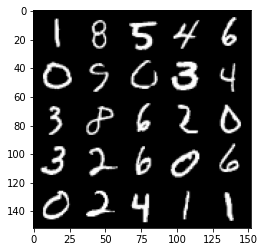

Step 10000: Generator loss: 4.235023321628568, discriminator loss: 0.0655529420077801


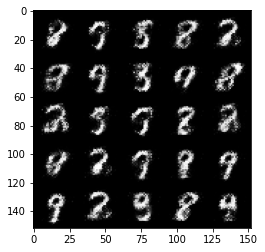

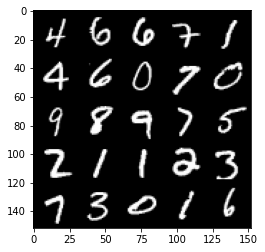

Step 10500: Generator loss: 4.472190963745116, discriminator loss: 0.058478613022714857


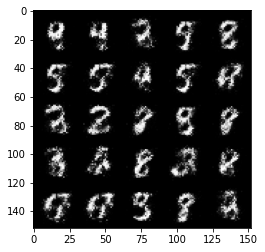

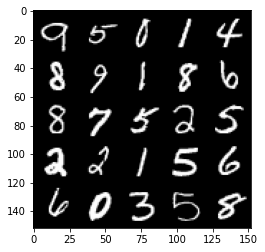

Step 11000: Generator loss: 4.468015766620634, discriminator loss: 0.06915119299665094


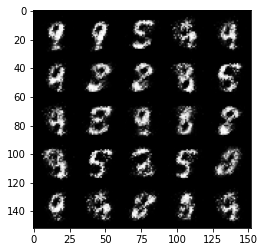

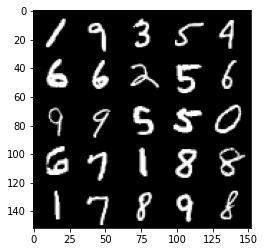

Step 11500: Generator loss: 4.325934436321258, discriminator loss: 0.07395151447504755


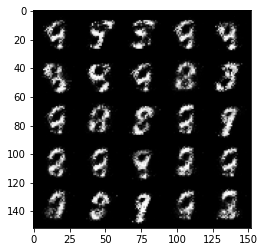

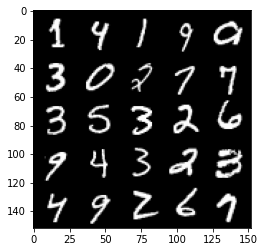

Step 12000: Generator loss: 4.0366136765480025, discriminator loss: 0.08628054302185784


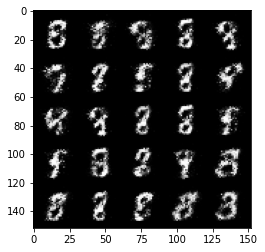

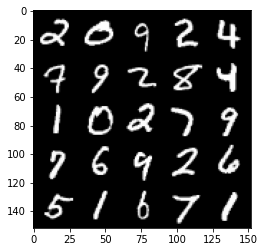

Step 12500: Generator loss: 4.200571310520173, discriminator loss: 0.08791820288449527


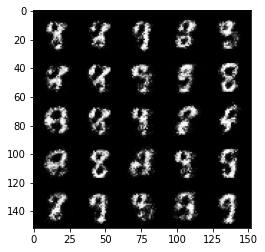

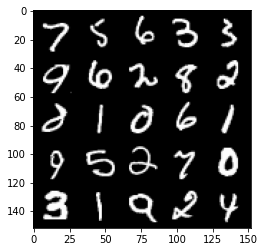

Step 13000: Generator loss: 4.025796411991119, discriminator loss: 0.09152976113557819


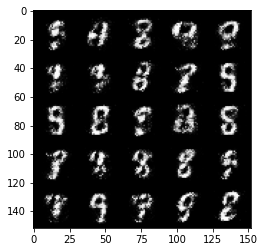

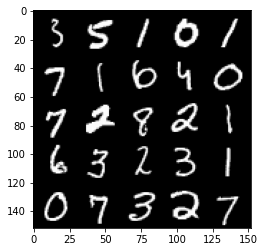

Step 13500: Generator loss: 3.978115165233608, discriminator loss: 0.09871962354332216


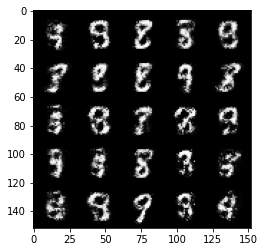

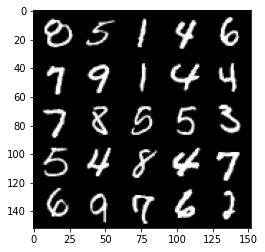

Step 14000: Generator loss: 3.9302096972465512, discriminator loss: 0.09621008145809166


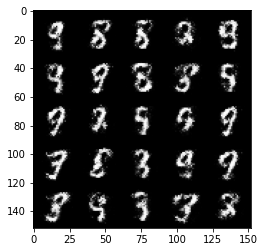

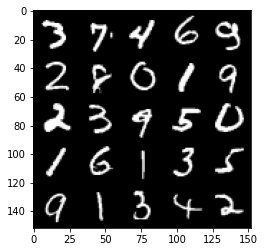

Step 14500: Generator loss: 3.990035975933073, discriminator loss: 0.08203106153756377


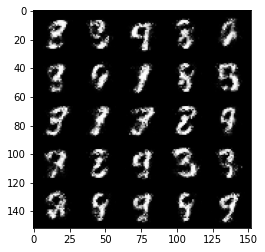

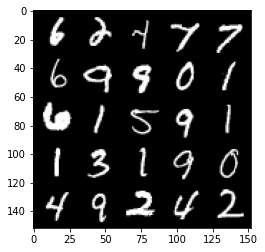

Step 15000: Generator loss: 4.092483101844789, discriminator loss: 0.07944304020702837


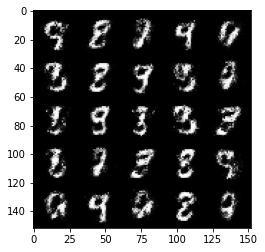

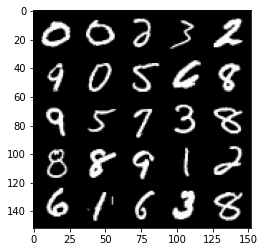

Step 15500: Generator loss: 3.985040413856506, discriminator loss: 0.09351768383383752


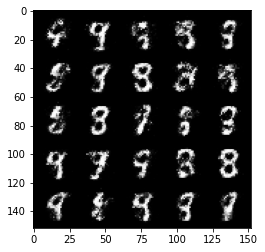

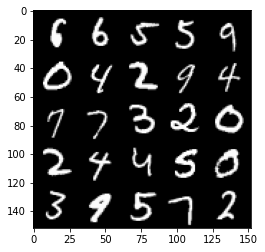

Step 16000: Generator loss: 3.9056210150718713, discriminator loss: 0.1138617356941104


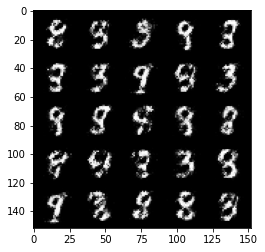

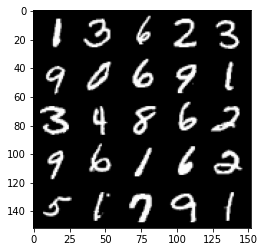

Step 16500: Generator loss: 3.9619941391944864, discriminator loss: 0.11122850317507976


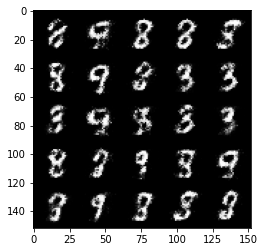

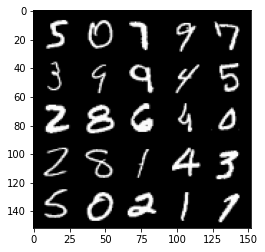

Step 17000: Generator loss: 3.792689885139463, discriminator loss: 0.12009180773794649


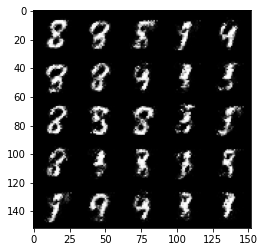

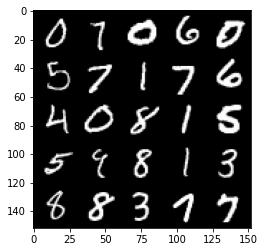

Step 17500: Generator loss: 3.778752258777617, discriminator loss: 0.10311089623719456


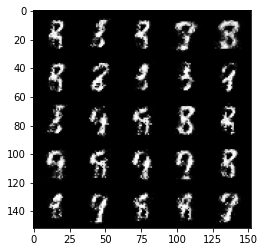

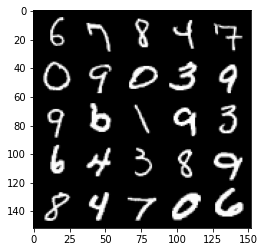

Step 18000: Generator loss: 3.8994284648895237, discriminator loss: 0.116268332079053


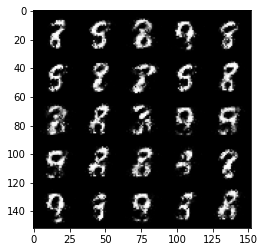

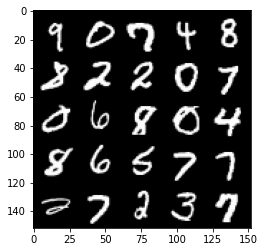

Step 18500: Generator loss: 3.835508792877198, discriminator loss: 0.11335481908172365


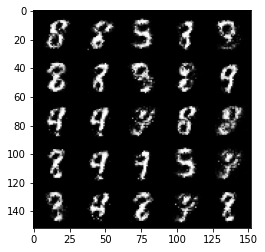

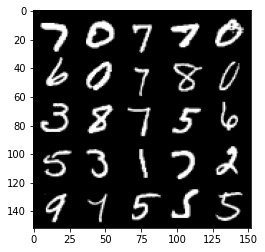

Step 19000: Generator loss: 3.764681191921235, discriminator loss: 0.11184299769252533


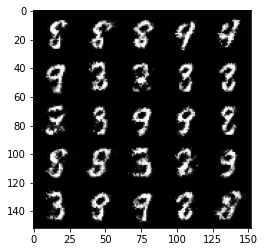

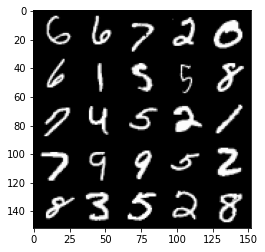

Step 19500: Generator loss: 3.8609721207618737, discriminator loss: 0.12169991885125638


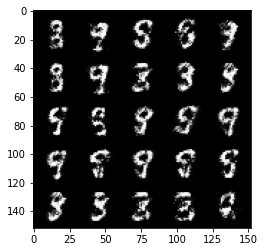

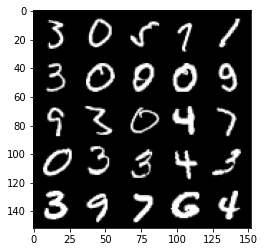

Step 20000: Generator loss: 3.6346259732246398, discriminator loss: 0.14179782827198495


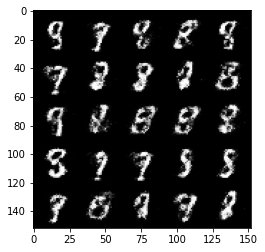

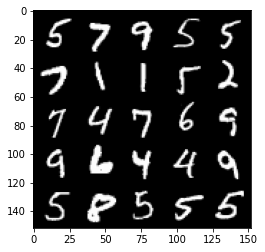

Step 20500: Generator loss: 3.5361245450973544, discriminator loss: 0.13060559953749187


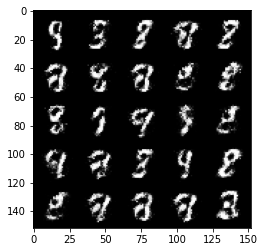

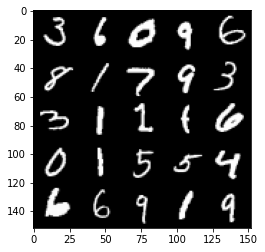

Step 21000: Generator loss: 3.6543256406784015, discriminator loss: 0.10677495770901425


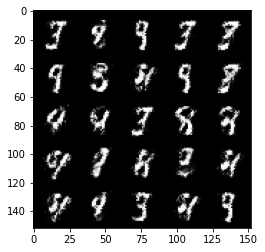

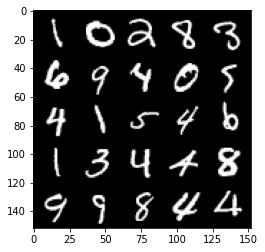

Step 21500: Generator loss: 3.6224610619545006, discriminator loss: 0.11490551528334624


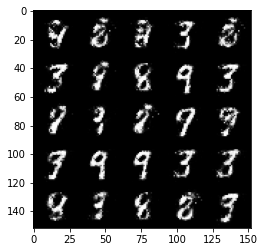

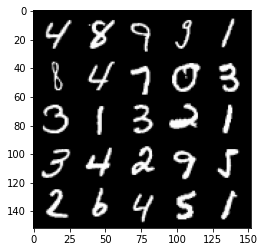

Step 22000: Generator loss: 3.557784855365754, discriminator loss: 0.12697200400382289


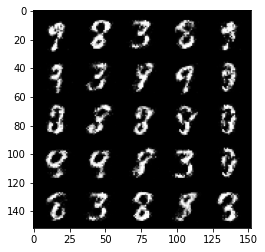

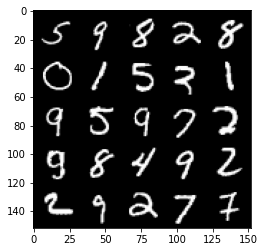

Step 22500: Generator loss: 3.434202018260952, discriminator loss: 0.1349186871945859


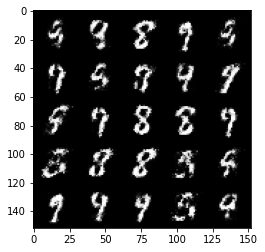

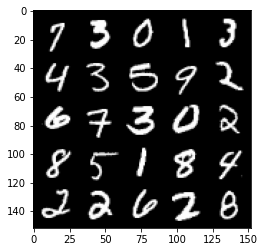

Step 23000: Generator loss: 3.386321345329286, discriminator loss: 0.1425542348921298


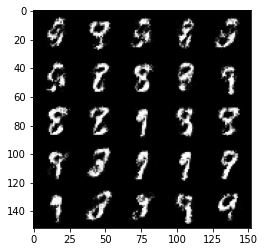

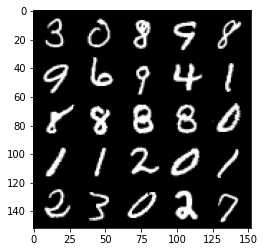

Step 23500: Generator loss: 3.3926153678894053, discriminator loss: 0.14011334925144897


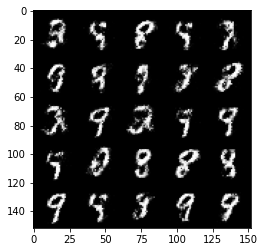

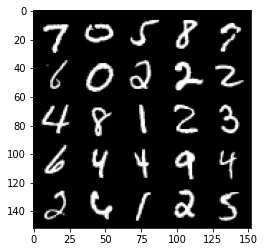

Step 24000: Generator loss: 3.2894605107307435, discriminator loss: 0.15155236913263806


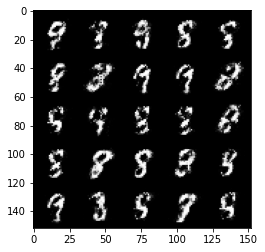

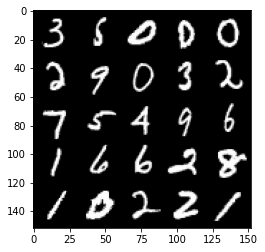

Step 24500: Generator loss: 3.2962867240905744, discriminator loss: 0.15774039806425577


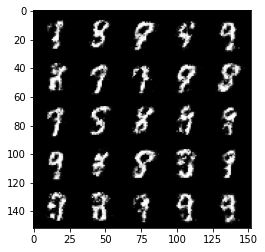

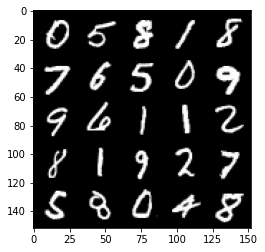

Step 25000: Generator loss: 3.15913312292099, discriminator loss: 0.1797364611029625


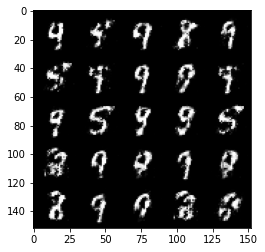

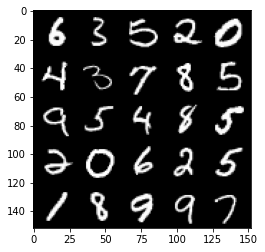

Step 25500: Generator loss: 3.23044926404953, discriminator loss: 0.16254951530694972


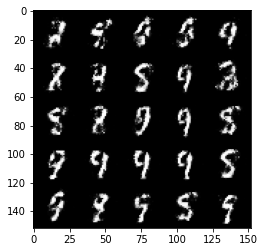

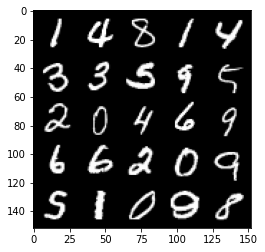

Step 26000: Generator loss: 3.1724043855667112, discriminator loss: 0.17880291661620137


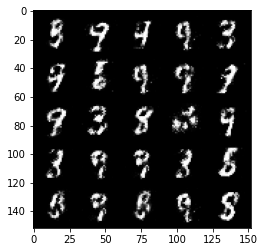

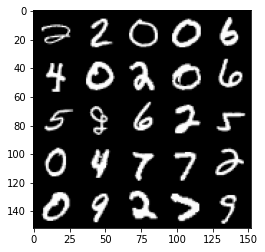

Step 26500: Generator loss: 2.9849432806968674, discriminator loss: 0.20504201388359067


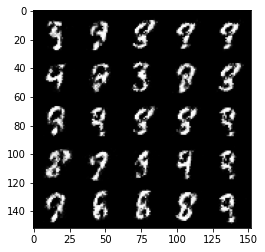

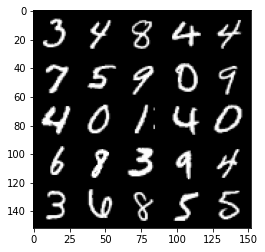

Step 27000: Generator loss: 2.8634828157424934, discriminator loss: 0.20434877787530448


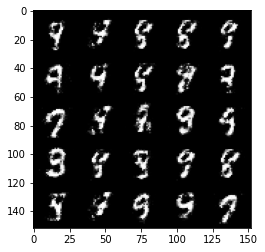

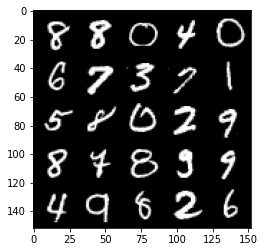

Step 27500: Generator loss: 2.8868998918533326, discriminator loss: 0.2144737344384192


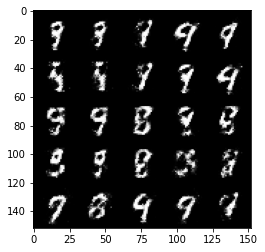

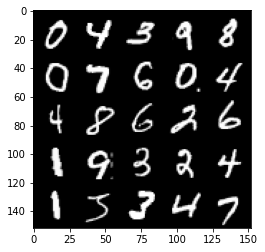

Step 28000: Generator loss: 2.759479494571688, discriminator loss: 0.22154557564854593


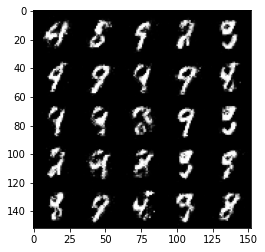

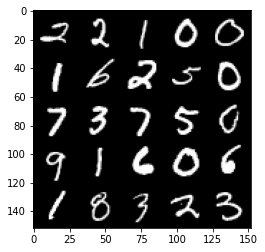

Step 28500: Generator loss: 2.8176633238792386, discriminator loss: 0.2113094962984323


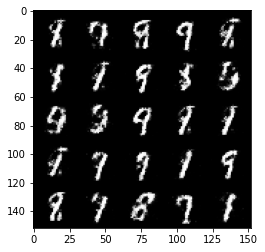

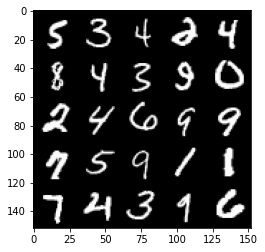

Step 29000: Generator loss: 2.661968130111695, discriminator loss: 0.22534757316112528


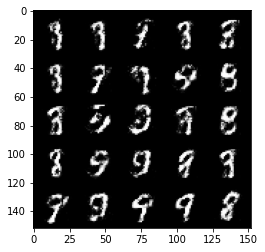

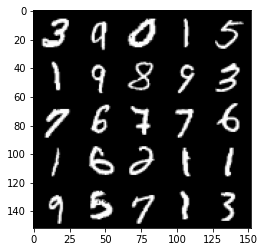

Step 29500: Generator loss: 2.7295800561904913, discriminator loss: 0.20864219087362285


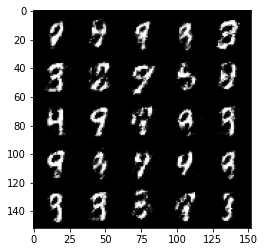

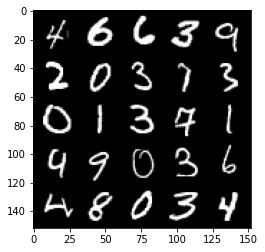

Step 30000: Generator loss: 2.722113224506376, discriminator loss: 0.22046427612006655


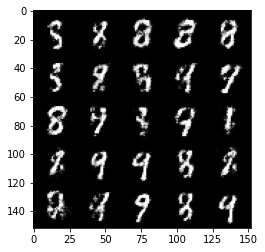

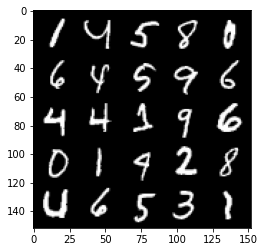

Step 30500: Generator loss: 2.506916367769243, discriminator loss: 0.250547222405672


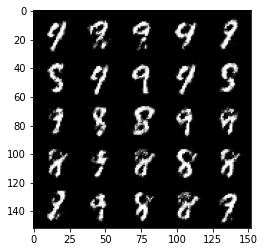

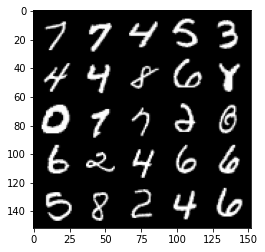

Step 31000: Generator loss: 2.6005347838401813, discriminator loss: 0.2260373231172563


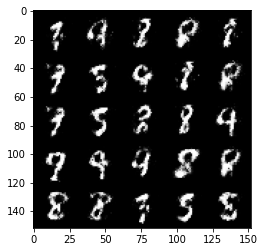

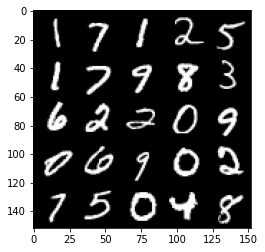

Step 31500: Generator loss: 2.6744464960098266, discriminator loss: 0.22043168142437936


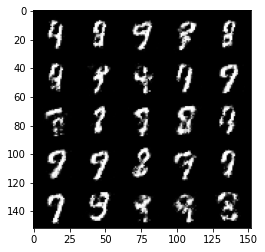

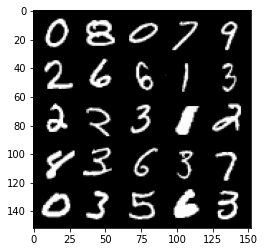

Step 32000: Generator loss: 2.6703934049606333, discriminator loss: 0.21844859156012525


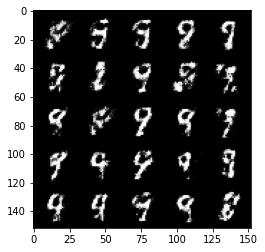

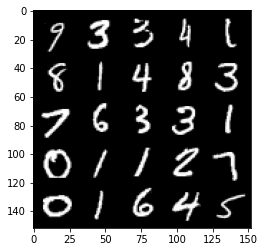

Step 32500: Generator loss: 2.563657190799712, discriminator loss: 0.23652728664875036


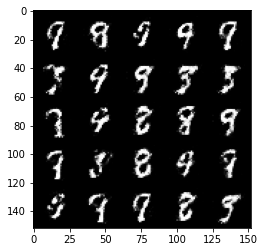

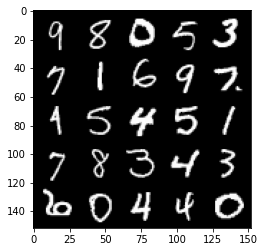

Step 33000: Generator loss: 2.7055241394042984, discriminator loss: 0.21142778271436696


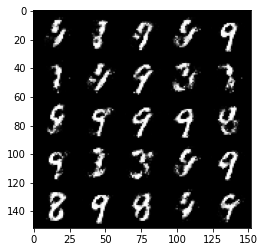

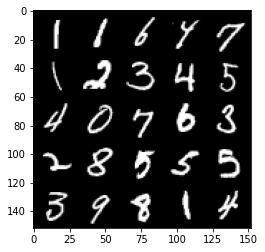

Step 33500: Generator loss: 2.5779366366863243, discriminator loss: 0.23839165455102945


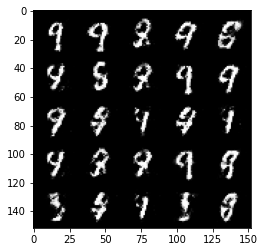

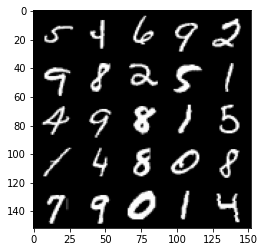

Step 34000: Generator loss: 2.450968204975128, discriminator loss: 0.2504439622461793


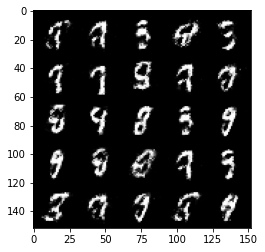

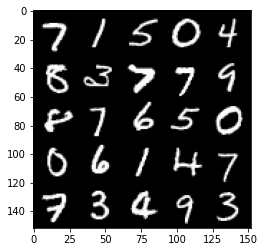

Step 34500: Generator loss: 2.532975377559664, discriminator loss: 0.2406642268300058


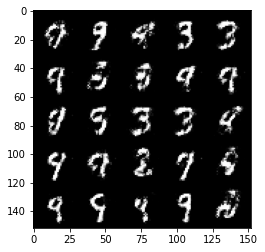

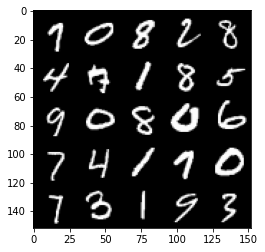

Step 35000: Generator loss: 2.496591013431547, discriminator loss: 0.24214198327064526


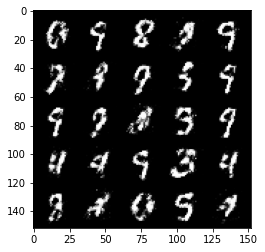

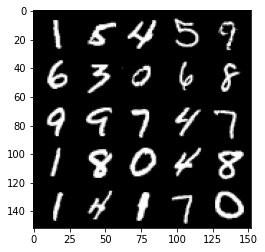

Step 35500: Generator loss: 2.660278162956236, discriminator loss: 0.21621043971180925


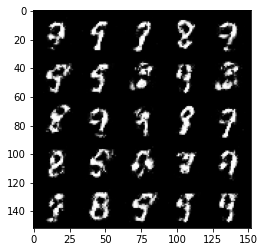

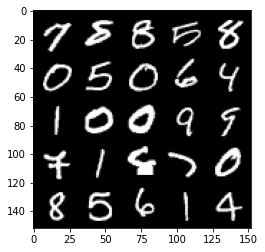

Step 36000: Generator loss: 2.49662577533722, discriminator loss: 0.2495010150372982


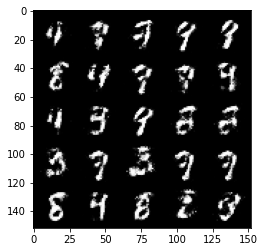

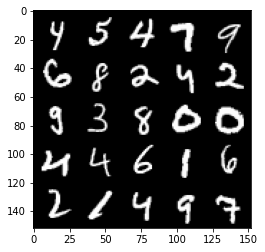

Step 36500: Generator loss: 2.55083924293518, discriminator loss: 0.24676639088988314


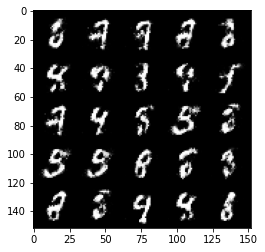

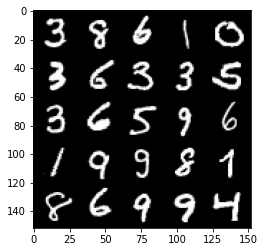

Step 37000: Generator loss: 2.4438418915271747, discriminator loss: 0.25750973492860796


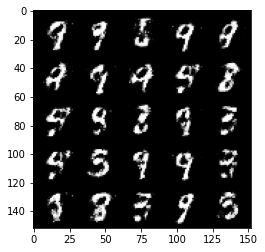

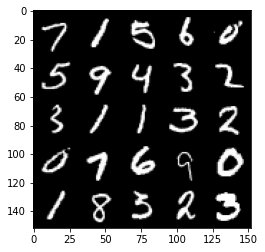

Step 37500: Generator loss: 2.408431109666823, discriminator loss: 0.26731184566020966


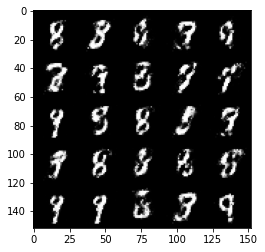

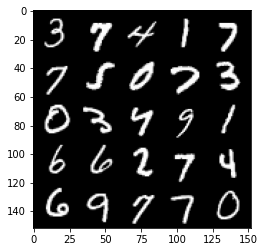

Step 38000: Generator loss: 2.372782059192658, discriminator loss: 0.2566950702369214


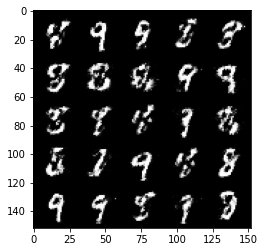

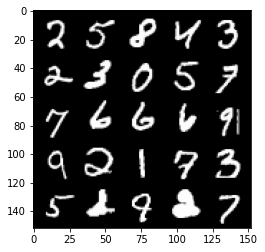

Step 38500: Generator loss: 2.4383538830280314, discriminator loss: 0.25015029162168506


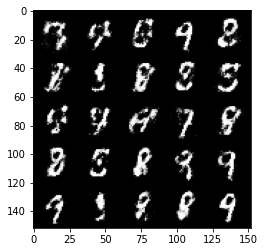

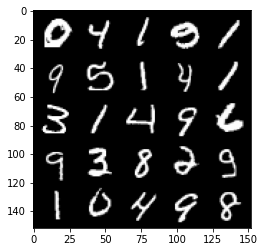

Step 39000: Generator loss: 2.303455331325531, discriminator loss: 0.2748229751586918


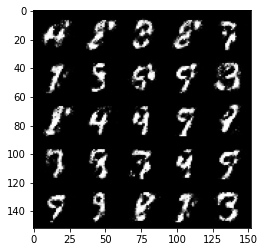

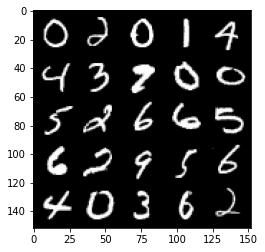

Step 39500: Generator loss: 2.478227702140803, discriminator loss: 0.25115248608589186


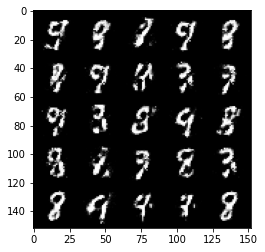

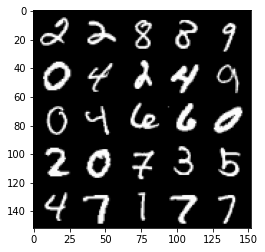

Step 40000: Generator loss: 2.343121192693709, discriminator loss: 0.27074261990189563


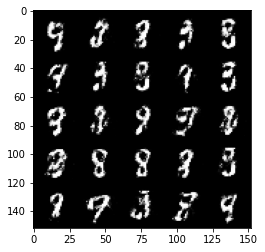

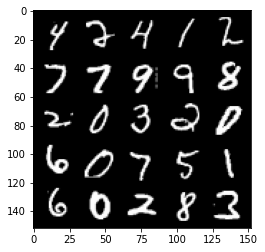

Step 40500: Generator loss: 2.3787514564990997, discriminator loss: 0.25167890545725824


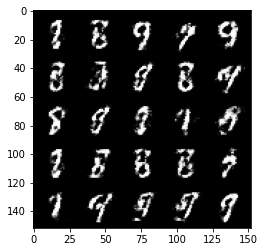

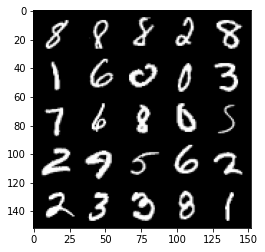

Step 41000: Generator loss: 2.4795285515785235, discriminator loss: 0.2386757985055448


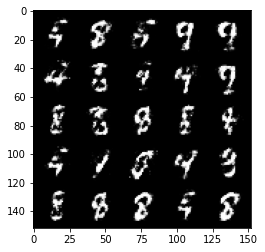

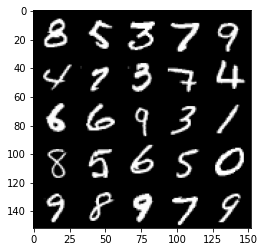

Step 41500: Generator loss: 2.35495618367195, discriminator loss: 0.2664442273080349


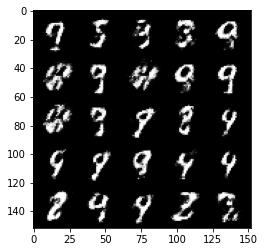

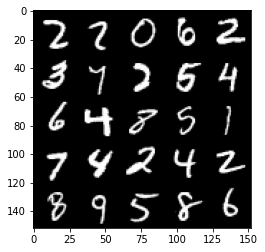

Step 42000: Generator loss: 2.3799294915199263, discriminator loss: 0.26429172462224965


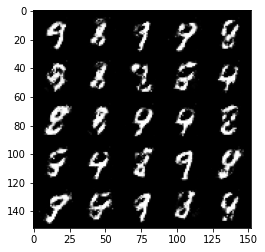

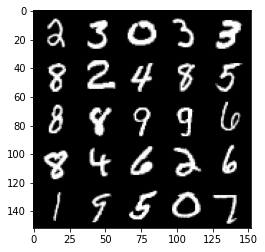

Step 42500: Generator loss: 2.391527177810668, discriminator loss: 0.2691734486520292


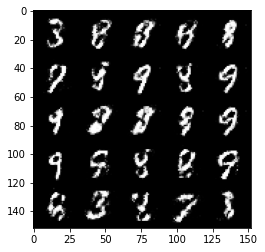

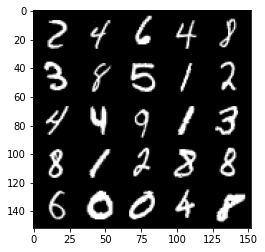

Step 43000: Generator loss: 2.34515365934372, discriminator loss: 0.27108652392029725


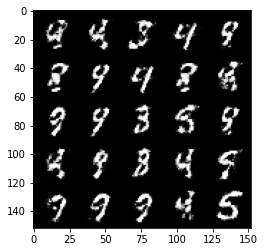

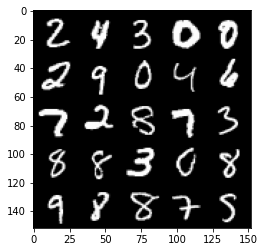

Step 43500: Generator loss: 2.3500533487796784, discriminator loss: 0.2780636363327504


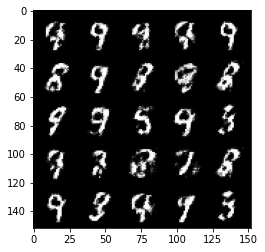

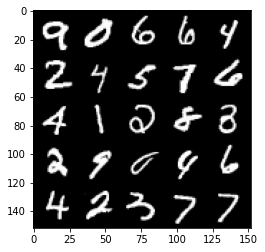

Step 44000: Generator loss: 2.390897597312927, discriminator loss: 0.2766727335155013


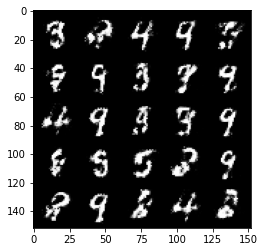

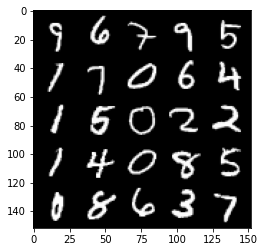

Step 44500: Generator loss: 2.180583986520769, discriminator loss: 0.31078595978021595


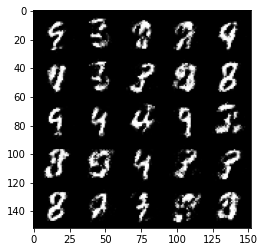

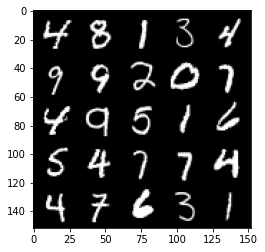

Step 45000: Generator loss: 2.172709510087966, discriminator loss: 0.2929722064435485


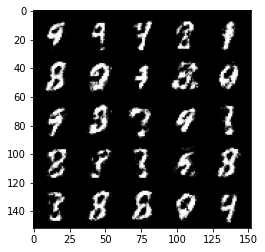

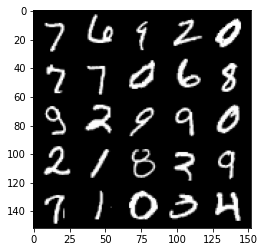

Step 45500: Generator loss: 2.26054694366455, discriminator loss: 0.2731975800395011


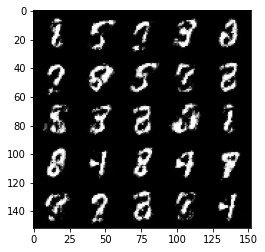

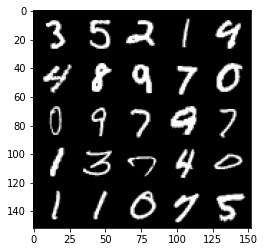

Step 46000: Generator loss: 2.2304360628128066, discriminator loss: 0.27442637810111076


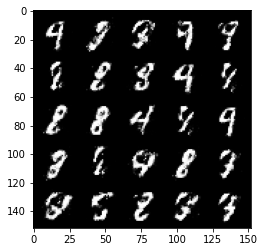

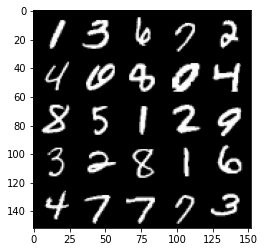

Step 46500: Generator loss: 2.2446215760707875, discriminator loss: 0.2843924204409125


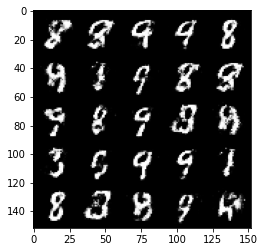

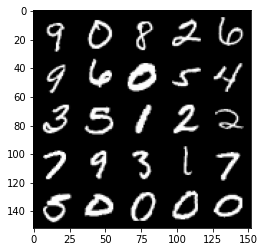

Step 47000: Generator loss: 2.1535636150836925, discriminator loss: 0.31254379877448085


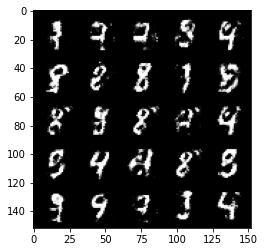

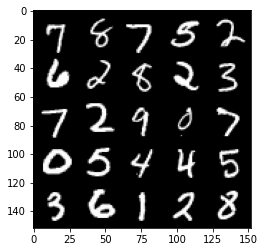

Step 47500: Generator loss: 2.2872540392875678, discriminator loss: 0.28437403810024225


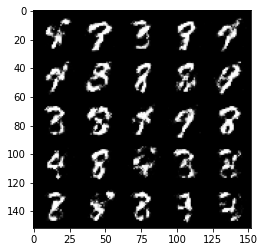

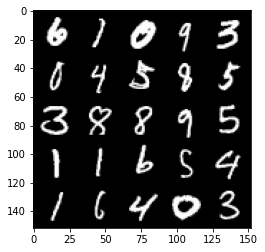

Step 48000: Generator loss: 2.1228621819019313, discriminator loss: 0.3102690294682982


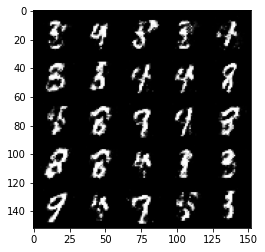

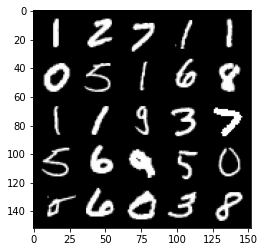

Step 48500: Generator loss: 2.237535250663757, discriminator loss: 0.27702859541773805


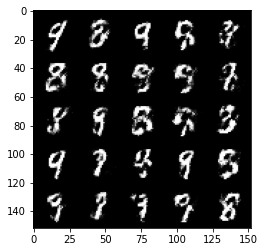

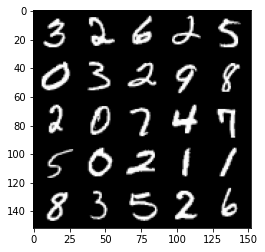

Step 49000: Generator loss: 2.087694696903226, discriminator loss: 0.3246599297821519


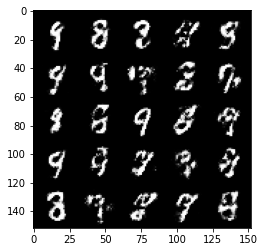

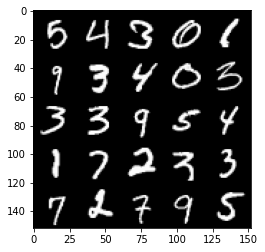

Step 49500: Generator loss: 2.0190698864460006, discriminator loss: 0.3410739957988264


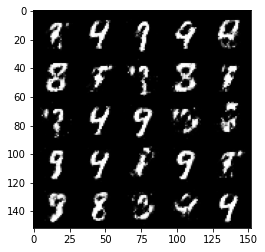

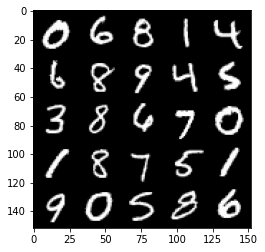

Step 50000: Generator loss: 2.0204364638328562, discriminator loss: 0.3274886309206484


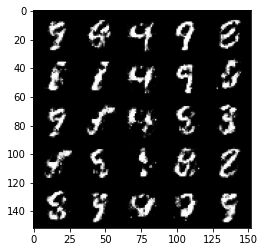

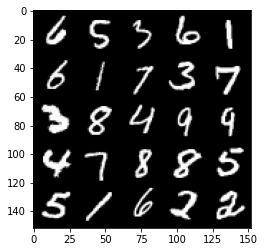

Step 50500: Generator loss: 2.0698543648719796, discriminator loss: 0.3214115368127821


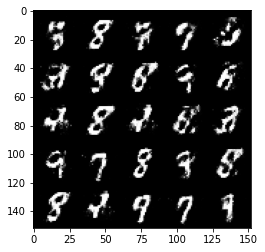

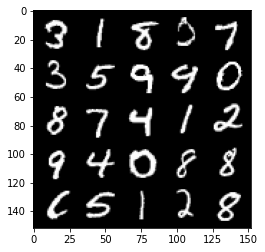

Step 51000: Generator loss: 1.8904169085025788, discriminator loss: 0.3673508157134053


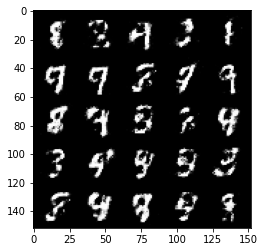

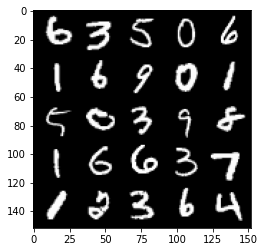

Step 51500: Generator loss: 1.88822488808632, discriminator loss: 0.353314825862646


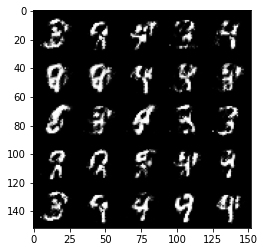

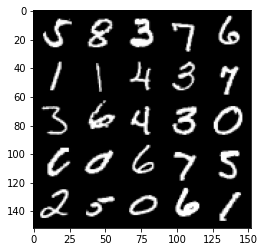

Step 52000: Generator loss: 1.864554148435591, discriminator loss: 0.3615704066157341


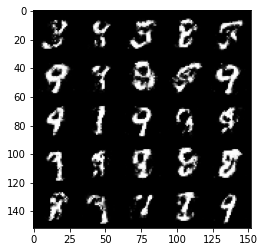

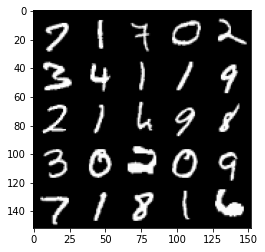

Step 52500: Generator loss: 1.8863270921707147, discriminator loss: 0.3459659834802146


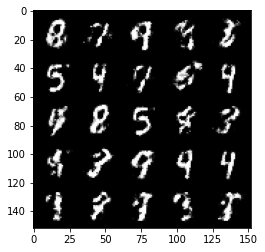

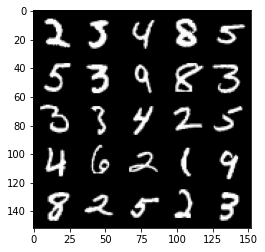

Step 53000: Generator loss: 1.8328739035129535, discriminator loss: 0.365852426588535


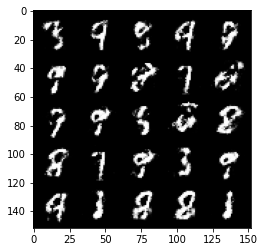

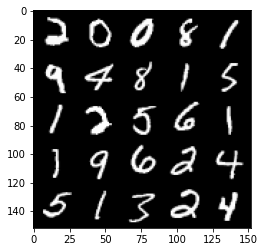

Step 53500: Generator loss: 1.860441544294358, discriminator loss: 0.352372383117676


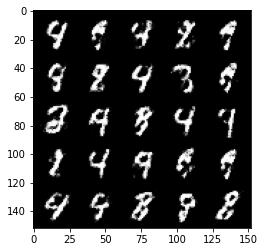

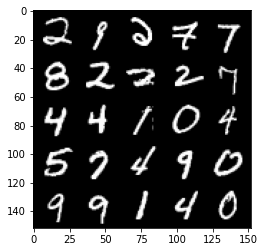

Step 54000: Generator loss: 1.8614793446063973, discriminator loss: 0.35037213471531886


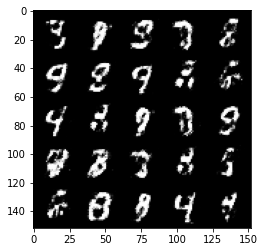

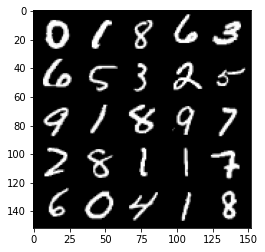

Step 54500: Generator loss: 1.8530777618885046, discriminator loss: 0.3615529640913008


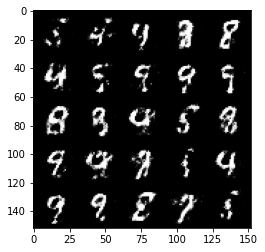

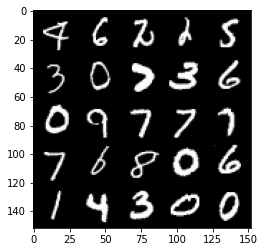

Step 55000: Generator loss: 1.8024131944179527, discriminator loss: 0.3694378407895562


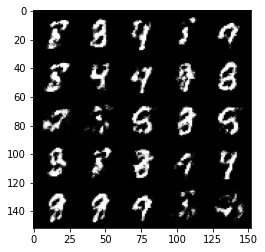

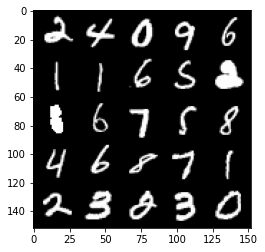

Step 55500: Generator loss: 1.820692615270614, discriminator loss: 0.37777580231428187


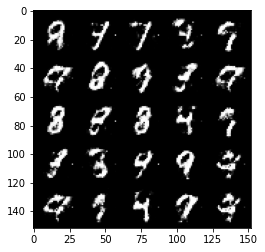

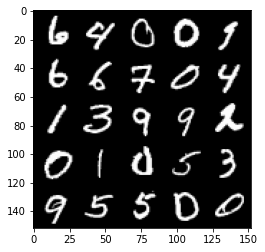

Step 56000: Generator loss: 1.7874031136035915, discriminator loss: 0.37145902204513537


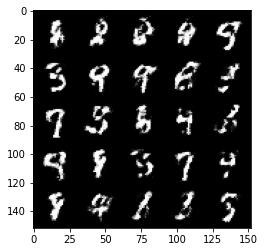

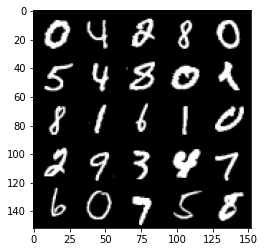

Step 56500: Generator loss: 1.8086686170101165, discriminator loss: 0.3576758629083634


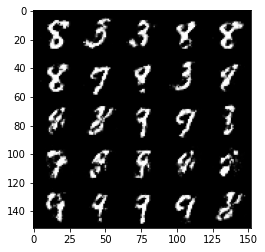

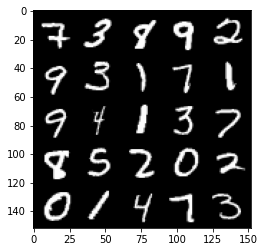

Step 57000: Generator loss: 1.8587127060890192, discriminator loss: 0.3589878789186479


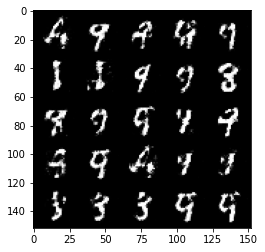

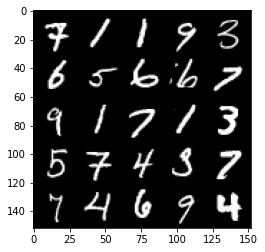

Step 57500: Generator loss: 1.8455744533538805, discriminator loss: 0.34116733157634743


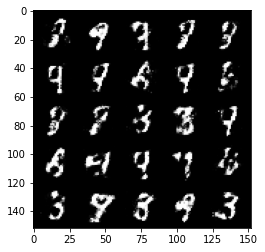

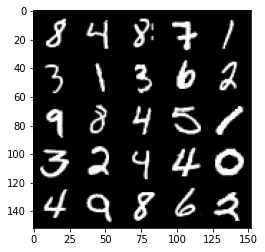

Step 58000: Generator loss: 1.8428846952915199, discriminator loss: 0.35746747004985785


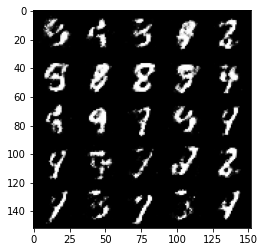

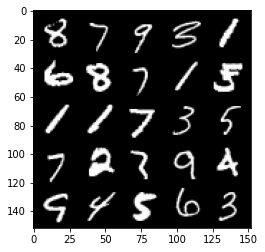

Step 58500: Generator loss: 1.7181594996452316, discriminator loss: 0.38723329275846435


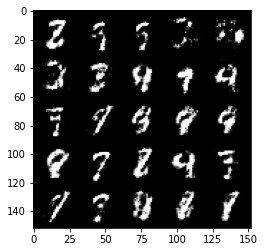

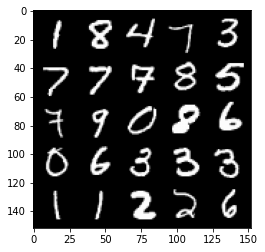

Step 59000: Generator loss: 1.7037826697826377, discriminator loss: 0.38524312353134166


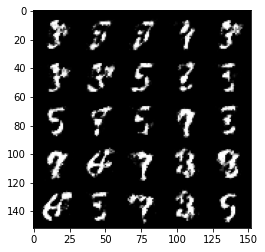

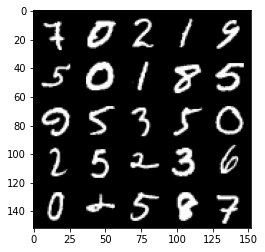

Step 59500: Generator loss: 1.8470643911361702, discriminator loss: 0.35403685665130585


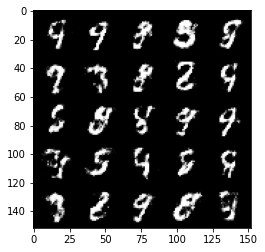

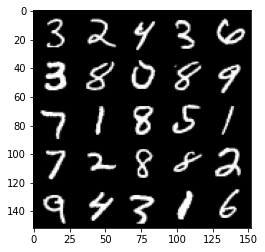

Step 60000: Generator loss: 1.8016307375431049, discriminator loss: 0.3853858752846717


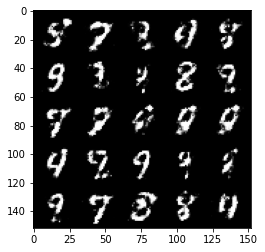

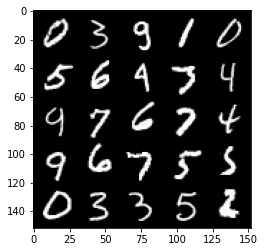

Step 60500: Generator loss: 1.7245270550250997, discriminator loss: 0.39296255528926866


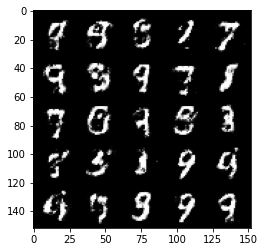

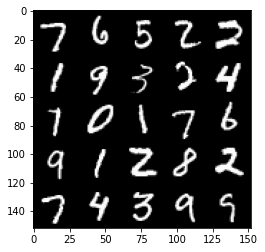

Step 61000: Generator loss: 1.7424325306415553, discriminator loss: 0.3699629212021827


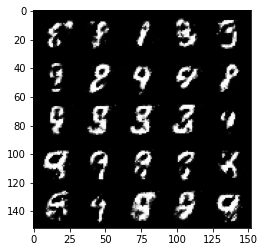

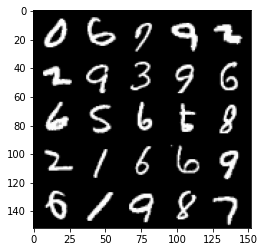

Step 61500: Generator loss: 1.7098436937332164, discriminator loss: 0.38344706976413767


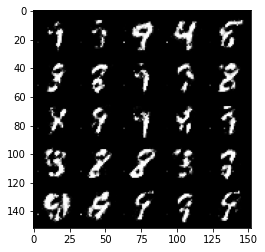

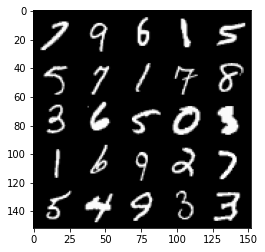

Step 62000: Generator loss: 1.8406419100761422, discriminator loss: 0.35074645963311163


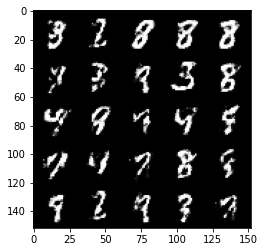

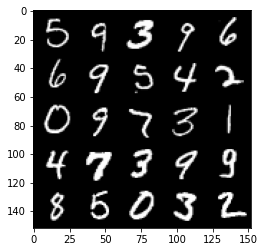

Step 62500: Generator loss: 1.7668147540092458, discriminator loss: 0.3698019110858443


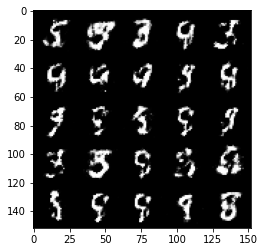

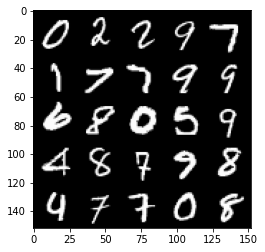

Step 63000: Generator loss: 1.7752162804603568, discriminator loss: 0.36333493375778164


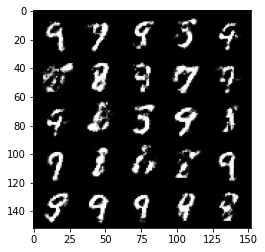

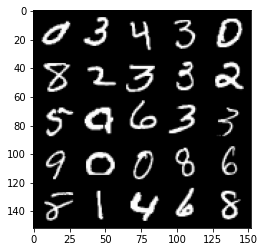

Step 63500: Generator loss: 1.7874226980209358, discriminator loss: 0.37105504226684566


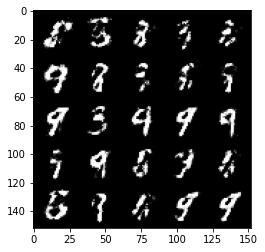

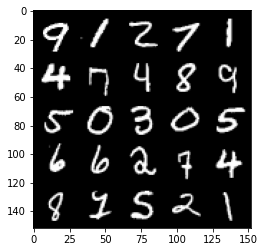

Step 64000: Generator loss: 1.8403707373142235, discriminator loss: 0.3388787528574471


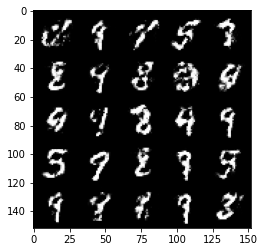

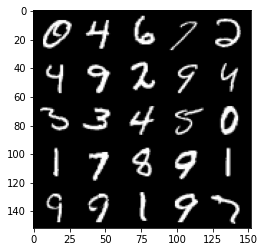

Step 64500: Generator loss: 1.7388815181255344, discriminator loss: 0.37566384875774367


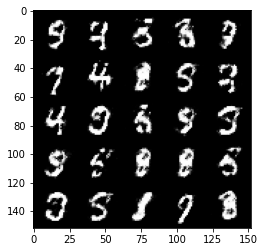

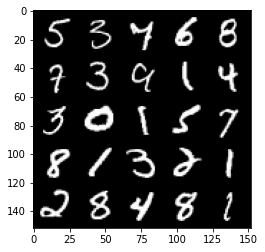

Step 65000: Generator loss: 1.7081849527359005, discriminator loss: 0.3820122198164462


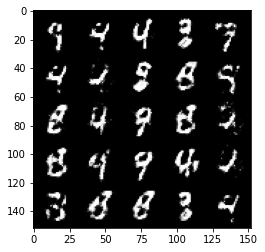

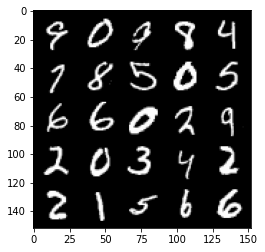

Step 65500: Generator loss: 1.7148776619434354, discriminator loss: 0.37200000715255743


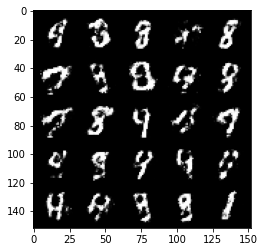

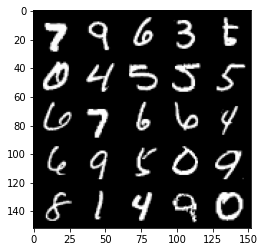

Step 66000: Generator loss: 1.678606441497804, discriminator loss: 0.38194525587558736


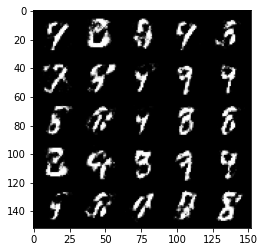

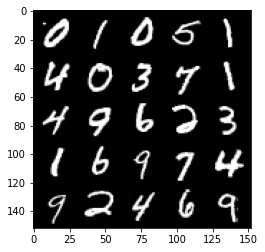

Step 66500: Generator loss: 1.8089099013805385, discriminator loss: 0.34817028033733377


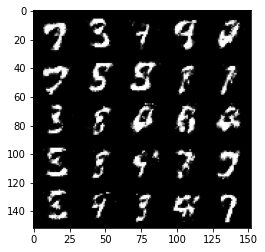

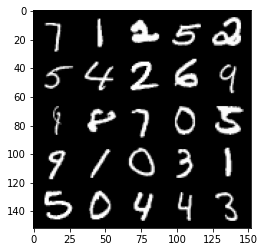

Step 67000: Generator loss: 1.7448766970634464, discriminator loss: 0.36825396370887764


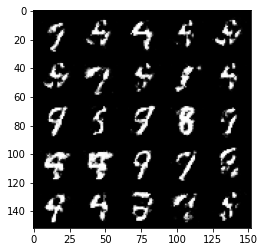

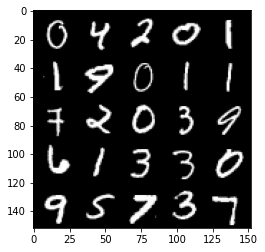

Step 67500: Generator loss: 1.758844891786576, discriminator loss: 0.3528574929535389


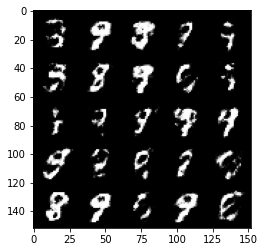

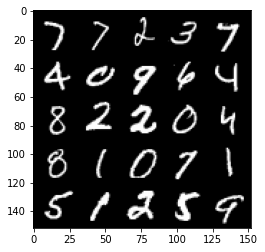

Step 68000: Generator loss: 1.730305958032607, discriminator loss: 0.35614826655387866


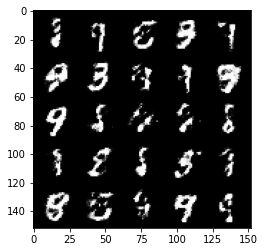

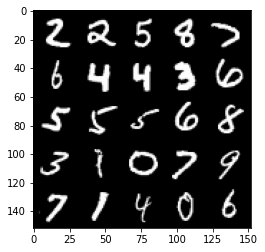

Step 68500: Generator loss: 1.7189341967105853, discriminator loss: 0.3655541857481007


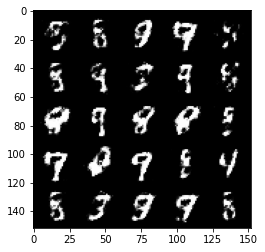

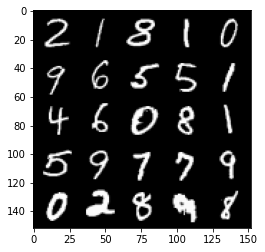

Step 69000: Generator loss: 1.722008921146392, discriminator loss: 0.374998534947634


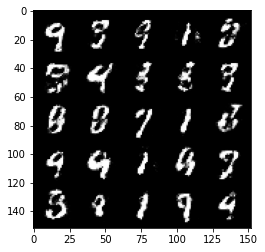

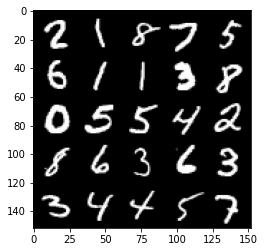

Step 69500: Generator loss: 1.7895046567916855, discriminator loss: 0.3559218329787256


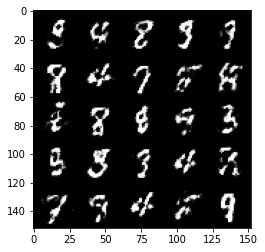

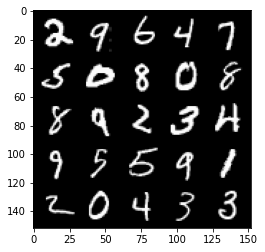

Step 70000: Generator loss: 1.8058053631782516, discriminator loss: 0.34235276272893


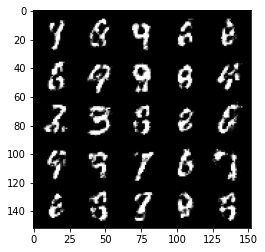

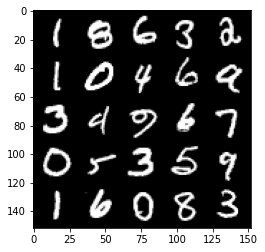

Step 70500: Generator loss: 1.7865698003768902, discriminator loss: 0.36627348649501806


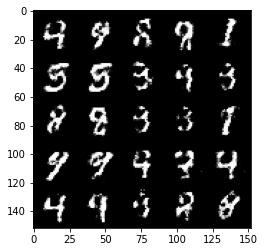

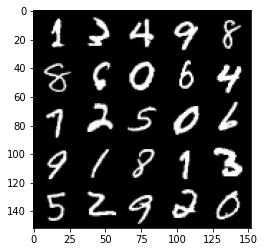

Step 71000: Generator loss: 1.8080785300731654, discriminator loss: 0.33490506964921957


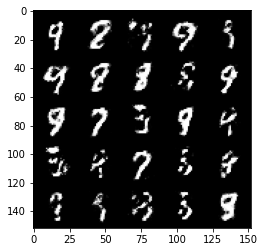

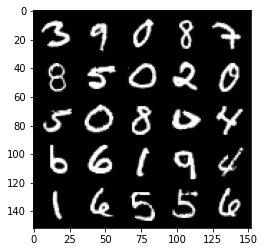

Step 71500: Generator loss: 1.7113268628120415, discriminator loss: 0.3785648863911632


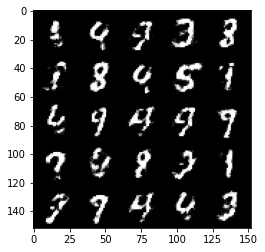

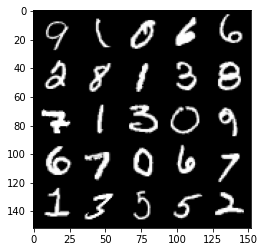

Step 72000: Generator loss: 1.6622417006492605, discriminator loss: 0.38803396052122097


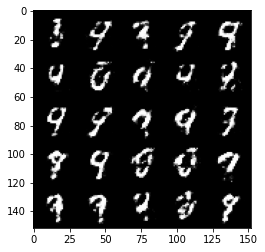

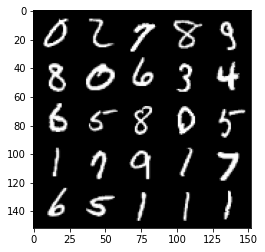

Step 72500: Generator loss: 1.6826270213127146, discriminator loss: 0.37994324058294265


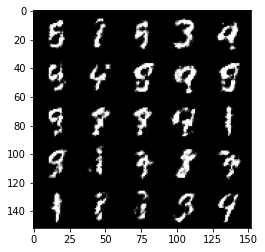

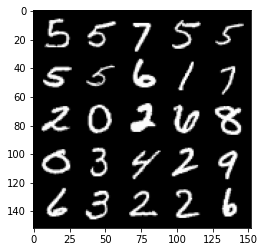

Step 73000: Generator loss: 1.6550772202014916, discriminator loss: 0.37805119714140917


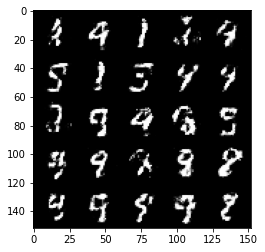

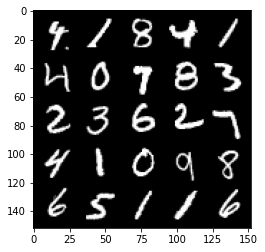

Step 73500: Generator loss: 1.6317840147018445, discriminator loss: 0.3884042972922324


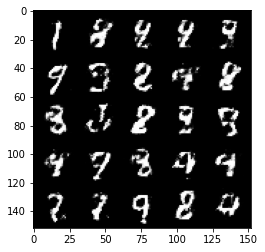

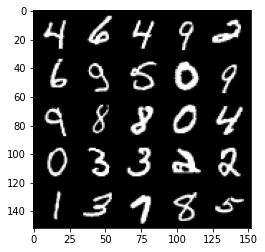

Step 74000: Generator loss: 1.6081868283748628, discriminator loss: 0.4104694823622703


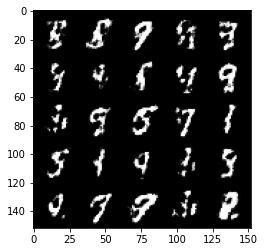

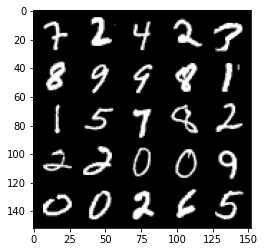

Step 74500: Generator loss: 1.6616827909946446, discriminator loss: 0.37642890763282794


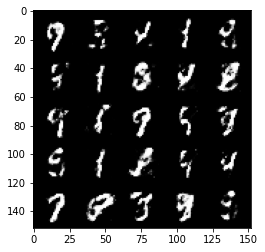

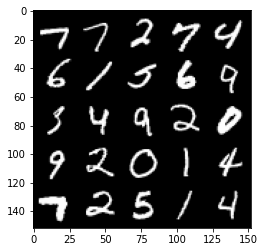

Step 75000: Generator loss: 1.589012126922607, discriminator loss: 0.408813085615635


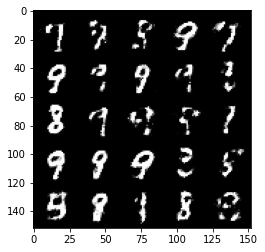

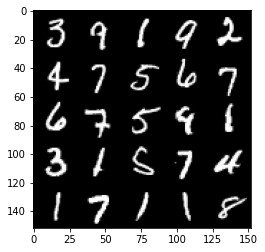

Step 75500: Generator loss: 1.491530218839646, discriminator loss: 0.42657659947872156


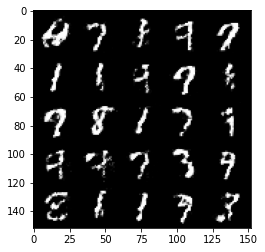

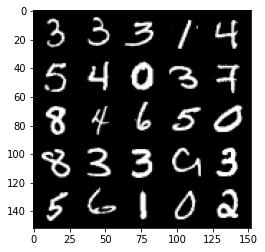

Step 76000: Generator loss: 1.4978773512840269, discriminator loss: 0.4281978505253789


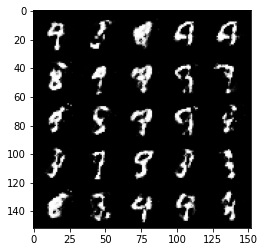

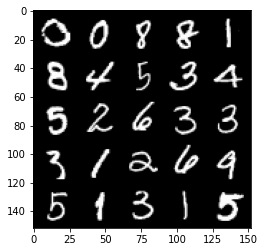

Step 76500: Generator loss: 1.5314933993816389, discriminator loss: 0.4158251767754556


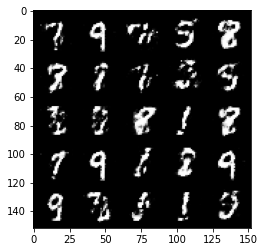

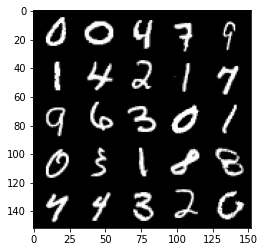

Step 77000: Generator loss: 1.551602288007735, discriminator loss: 0.41569576495885846


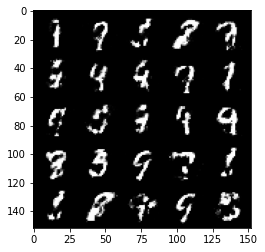

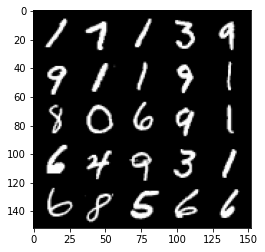

Step 77500: Generator loss: 1.491213113546372, discriminator loss: 0.43142229127883913


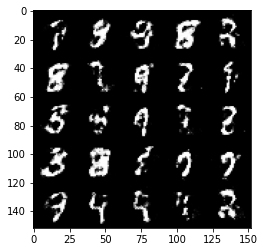

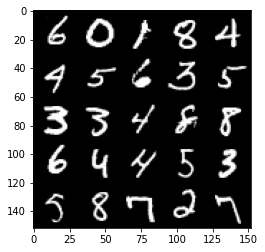

Step 78000: Generator loss: 1.5044073629379264, discriminator loss: 0.4063867883682251


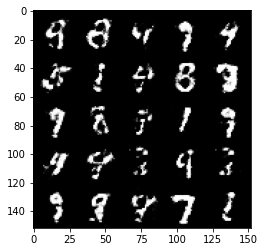

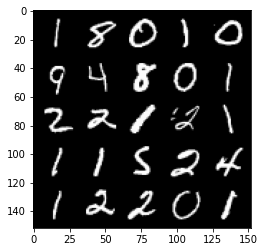

Step 78500: Generator loss: 1.5764914929866798, discriminator loss: 0.39783629190921777


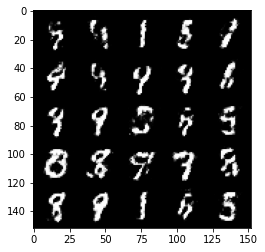

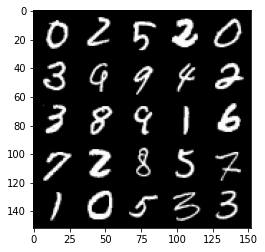

Step 79000: Generator loss: 1.5070867724418668, discriminator loss: 0.42249879258871087


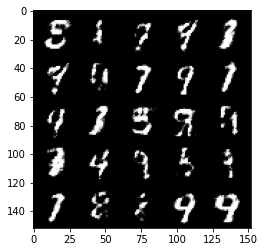

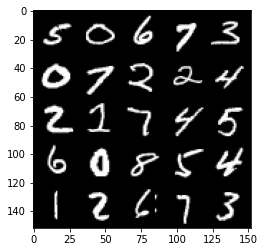

Step 79500: Generator loss: 1.4663660438060757, discriminator loss: 0.4397928956747058


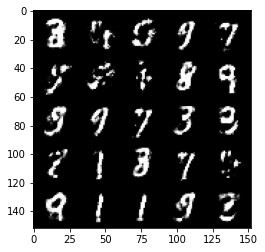

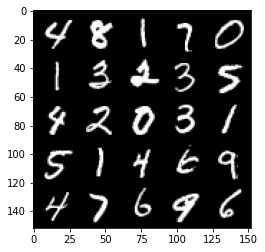

Step 80000: Generator loss: 1.5137098453044904, discriminator loss: 0.4118161695003514


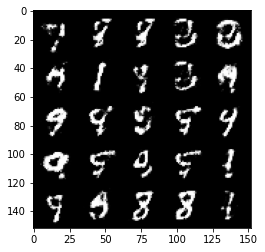

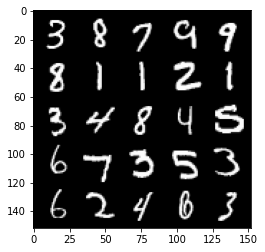

Step 80500: Generator loss: 1.407979138612747, discriminator loss: 0.46470596605539294


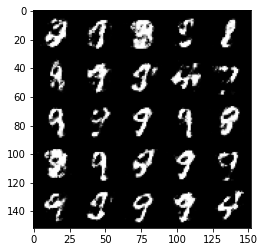

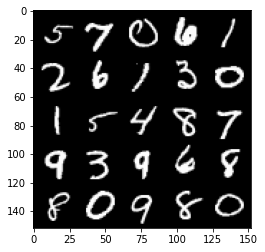

Step 81000: Generator loss: 1.4481316742897052, discriminator loss: 0.44197852563858053


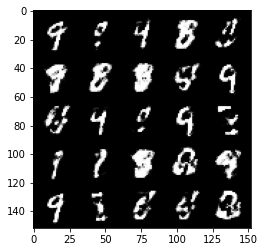

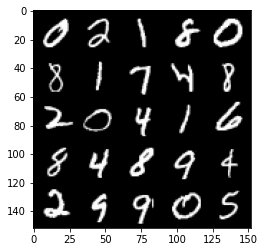

Step 81500: Generator loss: 1.4487102513313284, discriminator loss: 0.41776101869344695


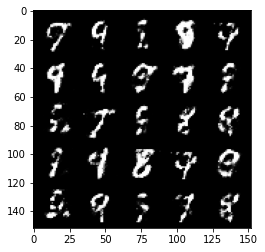

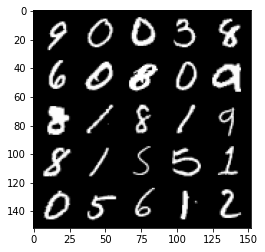

Step 82000: Generator loss: 1.5220855631828312, discriminator loss: 0.40556711751222596


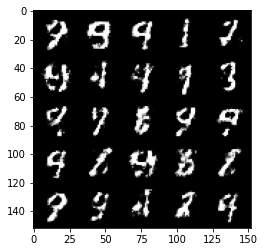

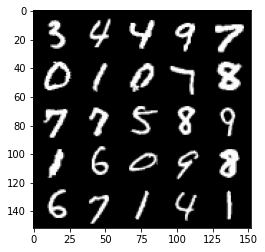

Step 82500: Generator loss: 1.555097696065901, discriminator loss: 0.4231181080341339


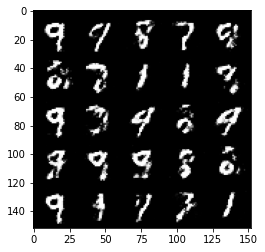

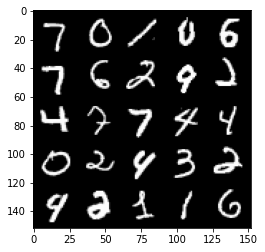

Step 83000: Generator loss: 1.5375517144203192, discriminator loss: 0.41780199915170646


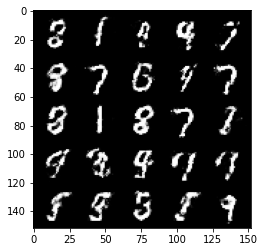

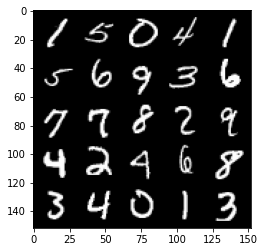

Step 83500: Generator loss: 1.4377280704975126, discriminator loss: 0.44816339135169914


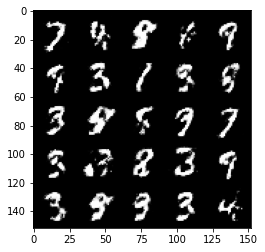

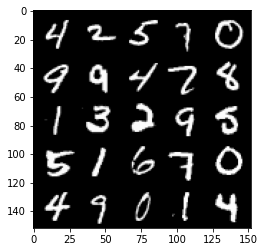

Step 84000: Generator loss: 1.4055819766521458, discriminator loss: 0.4580266070961952


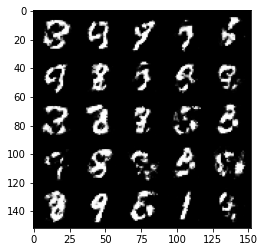

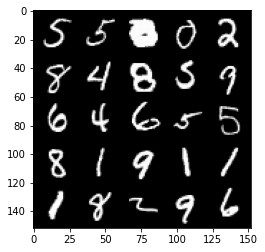

Step 84500: Generator loss: 1.3513064162731179, discriminator loss: 0.4720589976310732


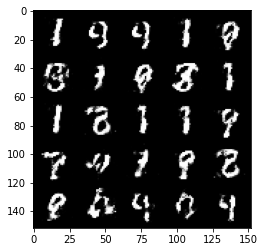

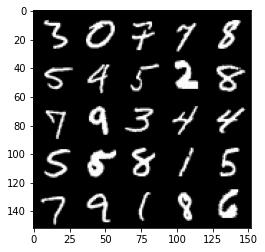

Step 85000: Generator loss: 1.434755545377731, discriminator loss: 0.4418134642243385


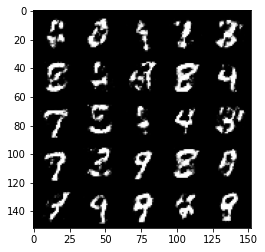

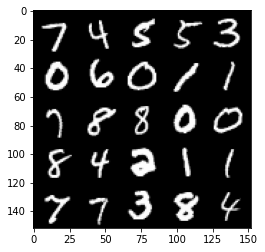

Step 85500: Generator loss: 1.4332226245403275, discriminator loss: 0.44163721513748205


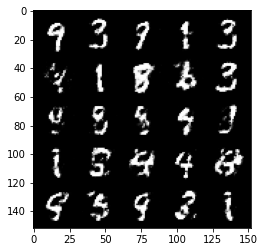

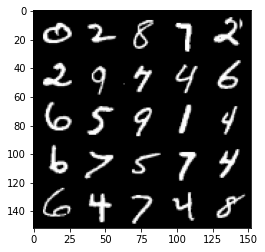

Step 86000: Generator loss: 1.3356468322277073, discriminator loss: 0.47890217894315723


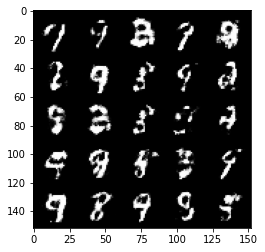

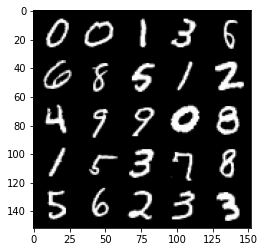

Step 86500: Generator loss: 1.3545981087684635, discriminator loss: 0.4586560359001159


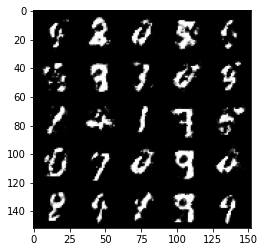

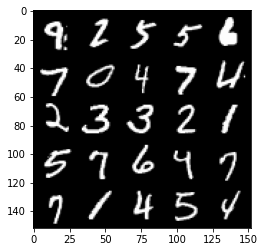

Step 87000: Generator loss: 1.3385986750125871, discriminator loss: 0.4686043585538863


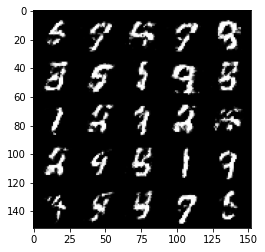

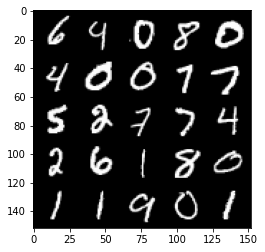

Step 87500: Generator loss: 1.4351565544605251, discriminator loss: 0.43657078057527554


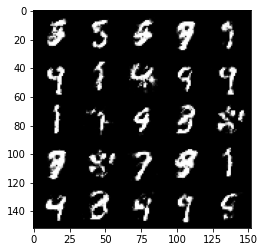

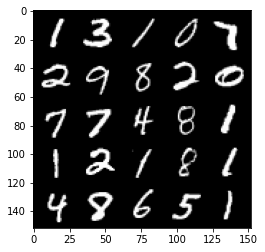

Step 88000: Generator loss: 1.3795411310195929, discriminator loss: 0.45889908361434945


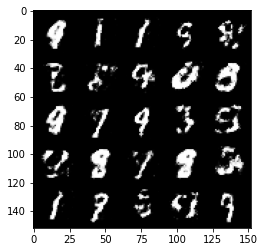

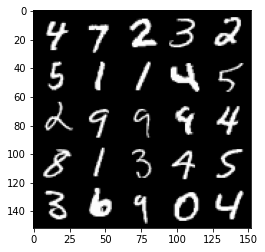

Step 88500: Generator loss: 1.3890245802402497, discriminator loss: 0.44752921521663674


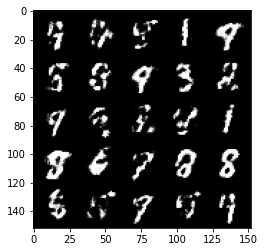

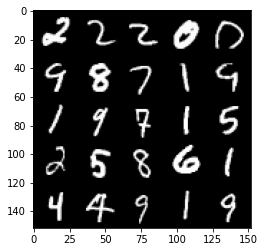

Step 89000: Generator loss: 1.3761338763237003, discriminator loss: 0.4688305196166037


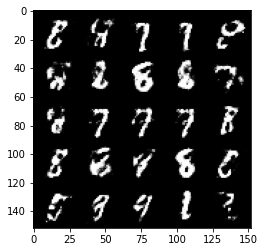

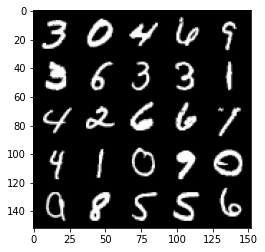

Step 89500: Generator loss: 1.3337010359764088, discriminator loss: 0.47637228107452384


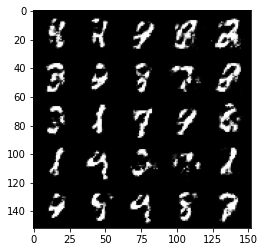

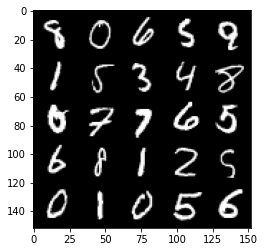

Step 90000: Generator loss: 1.3374761624336235, discriminator loss: 0.4644523311853413


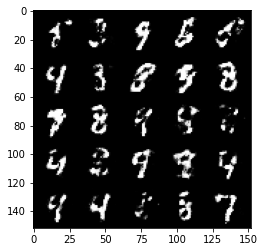

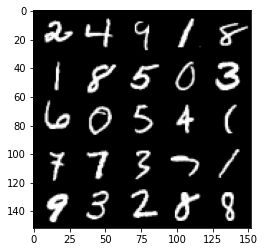

Step 90500: Generator loss: 1.3258510169982907, discriminator loss: 0.47614448851346947


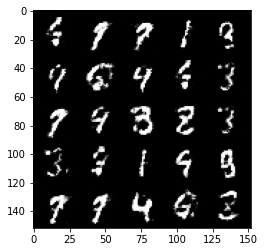

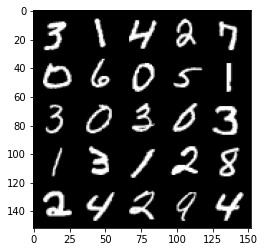

Step 91000: Generator loss: 1.308435758113862, discriminator loss: 0.48531265807151824


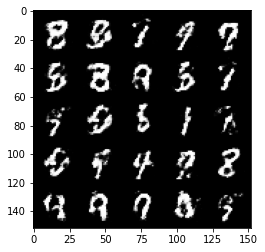

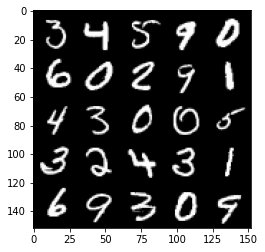

Step 91500: Generator loss: 1.3188166790008555, discriminator loss: 0.4815400080084802


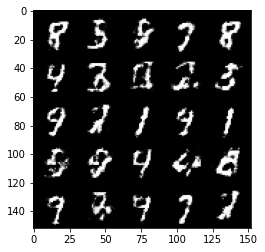

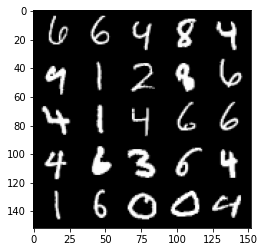

Step 92000: Generator loss: 1.3191940038204197, discriminator loss: 0.4781918892264369


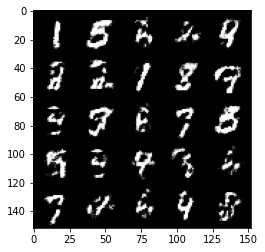

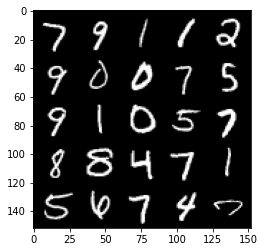

Step 92500: Generator loss: 1.2839526586532608, discriminator loss: 0.49014023053646083


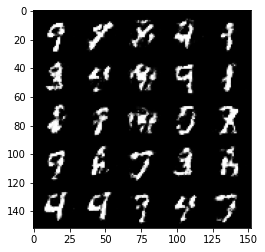

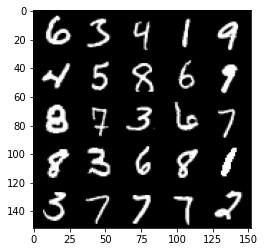

Step 93000: Generator loss: 1.252953285455704, discriminator loss: 0.49461927002668393


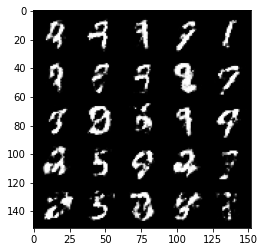

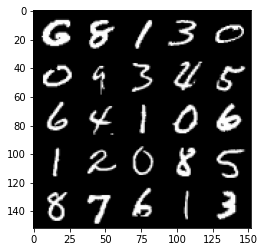

Step 93500: Generator loss: 1.335092796325685, discriminator loss: 0.45991227066516865


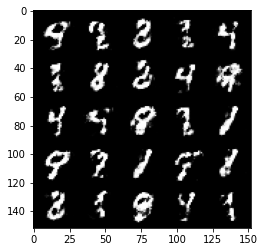

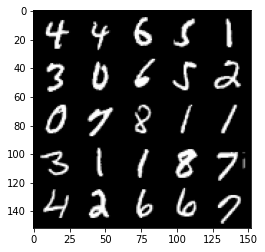

In [109]:
# OPTIONAL PART

cur_step = 0
mean_generator_loss = 0
mean_discriminator_loss = 0
test_generator = True # Whether the generator should be tested
gen_loss = False
error = False
for epoch in range(n_epochs):
  
    # Dataloader returns the batches
    for real, _ in tqdm(dataloader):
        cur_batch_size = len(real)

        # Flatten the batch of real images from the dataset
        real = real.view(cur_batch_size, -1).to(device)

        ### Update discriminator ###
        # Zero out the gradients before backpropagation
        disc_opt.zero_grad()

        # Calculate discriminator loss
        disc_loss = get_disc_loss(gen, disc, criterion, real, cur_batch_size, z_dim, device)

        # Update gradients
        disc_loss.backward(retain_graph=True)

        # Update optimizer
        disc_opt.step()

        # For testing purposes, to keep track of the generator weights
        if test_generator:
            old_generator_weights = gen.gen[0][0].weight.detach().clone()

        ### Update generator ###
        #     Hint: This code will look a lot like the discriminator updates!
        #     These are the steps you will need to complete:
        #       1) Zero out the gradients.
        #       2) Calculate the generator loss, assigning it to gen_loss.
        #       3) Backprop through the generator: update the gradients and optimizer.
        #### START CODE HERE ####
        gen_opt.zero_grad()
        gen_loss = get_gen_loss(gen, disc, criterion, cur_batch_size, z_dim, device)
        gen_loss.backward()
        gen_opt.step()
        #### END CODE HERE ####

        # For testing purposes, to check that your code changes the generator weights
        if test_generator:
            try:
                assert lr > 0.0000002 or (gen.gen[0][0].weight.grad.abs().max() < 0.0005 and epoch == 0)
                assert torch.any(gen.gen[0][0].weight.detach().clone() != old_generator_weights)
            except:
                error = True
                print("Runtime tests have failed")

        # Keep track of the average discriminator loss
        mean_discriminator_loss += disc_loss.item() / display_step

        # Keep track of the average generator loss
        mean_generator_loss += gen_loss.item() / display_step

        ### Visualization code ###
        if cur_step % display_step == 0 and cur_step > 0:
            print(f"Step {cur_step}: Generator loss: {mean_generator_loss}, discriminator loss: {mean_discriminator_loss}")
            fake_noise = get_noise(cur_batch_size, z_dim, device=device)
            fake = gen(fake_noise)
            show_tensor_images(fake)
            show_tensor_images(real)
            mean_generator_loss = 0
            mean_discriminator_loss = 0
        cur_step += 1


If you don't get any runtime error, it means that your code works. We check that the weights are changing in each iteration within the function.

**Congratulations, you have trained your first GAN**